# Multimodal Search with OpenSearch Neural Search 

We will use Neural Search plugin in OpenSearch to implement semantic search

### 1. Check PyTorch Version


As in the previous modules, let's import PyTorch and confirm that have have the latest version of PyTorch. The version should already be 1.10.2 or higher. If not, please run the lab in order to get everything set up.

In [1]:
import torch
print(torch.__version__)

2.0.1


### 2. Retrieve notebook variables

The line below will retrieve your shared variables from the previous notebook.

In [ ]:
%store -r

### 3. Install OpenSearch ML Python library

In [ ]:
!pip install opensearch-py-ml
!pip install accelerate
!pip install deprecated
!pip install requests-aws4auth
!pip install jsonlines

Now we need to restart the kernel by running below cell.

In [ ]:
from IPython.display import display_html
def restartkernel() :
    display_html("<script>Jupyter.notebook.kernel.restart()</script>",raw=True)
restartkernel()

### 4. Import library



In [2]:
import boto3
import re
import time

### 5. Prepare datasets


In [3]:
fname_products = "meta_Books.json.gz"
#fname_products = "meta_Clothing_Shoes_and_Jewelry.json.gz"
#fname_products = "meta_Luxury_Beauty.json.gz"
#fname_products = "meta_Appliances.json.gz"
#fname_products = "meta_Automotive.json.gz"
#fname_products = "meta_Video_Games.json.gz"
#fname_products = "meta_Sports_and_Outdoors.json.gz"

!wget -nc http://snap.stanford.edu/data/amazon/productGraph/categoryFiles/{fname_products}

!gunzip {fname_products}

--2023-12-24 12:32:42--  http://snap.stanford.edu/data/amazon/productGraph/categoryFiles/meta_Books.json.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 825767823 (788M) [application/x-gzip]
Saving to: ‘meta_Books.json.gz’

100%[======================================>] 825,767,823 43.1MB/s   in 24s    

2023-12-24 12:33:07 (32.7 MB/s) - ‘meta_Books.json.gz’ saved [825767823/825767823]



In [4]:
import ast
count=0
with open('meta_Books.json', "r") as json_file:
    for line in json_file:
        #print(line)
        data = ast.literal_eval(line)
        if not 'title' in data or not data['title'] or not 'description' in data or not data['description'] or not 'imUrl' in data or not data['imUrl']:
            continue
        print("title: " + data['title'])
        print("description: " + data['description'])
        print("image: " + data['imUrl'])
        print("------------------------------------")
        count = count+1
        if count >= 1000:
            break


title: Measure for Measure: Complete &amp; Unabridged
description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.
image: http://ecx.images-amazon.com/images/I/5166EBHDQYL.jpg
------------------------------------
title: The Sherlock Holmes Audio Collection
description: &#34;One thing is certain, Sherlockians, put aside your Baring-GouldAnnotated, your Folio SocietyIllustrated-for the time being, the Oxford is the edition to curl up with on a winter's night&#34;--The Chicago Tribune&#34;An incomparable gift book; or, should you find it impossible to surrender up such treasures, the best of gifts to oneself&#34;--USA Today&#34;To the true Sherlockian, this will be a treasure; to otherwise diverted detective story fans, it is a rich lode for discovery&#34;--Denver Post&#34;The complet

### 6. Create an OpenSearch cluster connection.
Next, we'll use Python API to set up connection with OpenSearch Cluster.

Note: if you're using a region other than us-east-1, please update the region in the code below.

#### Get Cloud Formation stack output variables

We also need to grab some key values from the infrastructure we provisioned using CloudFormation. To do this, we will list the outputs from the stack and store this in "outputs" to be used later.

You can ignore any "PythonDeprecationWarning" warnings.

In [ ]:
import boto3

cfn = boto3.client('cloudformation')

def get_cfn_outputs(stackname):
    outputs = {}
    for output in cfn.describe_stacks(StackName=stackname)['Stacks'][0]['Outputs']:
        outputs[output['OutputKey']] = output['OutputValue']
    return outputs

## Setup variables to use for the rest of the demo
cloudformation_stack_name = "semantic-search"

outputs = get_cfn_outputs(cloudformation_stack_name)

bucket = outputs['s3BucketTraining']
aos_host = outputs['OpenSearchDomainEndpoint']

outputs

In [5]:
from opensearchpy import OpenSearch, RequestsHttpConnection, AWSV4SignerAuth
import boto3
import json

kms = boto3.client('secretsmanager')
#aos_credentials = json.loads(kms.get_secret_value(SecretId=outputs['OpenSearchSecret'])['SecretString'])

region = 'us-east-1' 

aos_host='search-multimodal-search-urlvgd5g3bxxfg3r4ntbqwjnjq.us-east-1.es.amazonaws.com'
auth = ('master', 'Semantic123!')

index_name = 'nlp_pqa'

aos_client = OpenSearch(
    hosts = [{'host': aos_host, 'port': 443}],
    http_auth = auth,
    use_ssl = True,
    verify_certs = True,
    connection_class = RequestsHttpConnection
)

### 7. Register Model Groups and External Connector 

Initialize OpenSearch authentication with AWS auth.

In [6]:
import boto3
import requests 
from requests_aws4auth import AWS4Auth

service = 'es'
credentials = boto3.Session().get_credentials()
awsauth = AWS4Auth(credentials.access_key, credentials.secret_key, region, service, session_token=credentials.token)


Register model group

---
### Note: Before run this cell, make sure you have completed the steps in the lab instruction "Map the ML role in OpenSearch Dashboards". 

If you don't complete the lab instruction steps, you will get "403" error, error message likes "There is error in creating connector{"error":{"root_cause":[{"type":"security_exception","reason":"no permissions for ...". 


In [7]:
path = '_plugins/_ml/model_groups/_register'
url = 'https://' + aos_host + '/' + path

payload = {
  "name": "remote_model_groups_for_embedding",
  "description": "A model group for remote models"
}

headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
if r.status_code == 200:
    data = json.loads(r.text)

    model_group_id = data['model_group_id']
    print("model group id:" + model_group_id)
else:
    raise Exception("There is error in creating model groups" + str(r.text))

400


Exception: There is error in creating model groups{"error":{"root_cause":[{"type":"illegal_argument_exception","reason":"The name you provided is already being used by a model group with ID: POy_lYwBM6Wnmn6fu5rs."}],"type":"illegal_argument_exception","reason":"The name you provided is already being used by a model group with ID: POy_lYwBM6Wnmn6fu5rs."},"status":400}

In [8]:
model_group_id="POy_lYwBM6Wnmn6fu5rs"

Uncomment the following code if you want delete model group. Replace  `{model_group_id}` with the value you want delete.

In [ ]:
# path = '_plugins/_ml/model_groups/{model_group_id}'
# url = 'https://' + aos_host + '/' + path


# headers = {"Content-Type": "application/json"}

# r = requests.delete(url, auth=awsauth, headers=headers)
# print(r.text)

Get account id

In [9]:
account_id = boto3.client('sts').get_caller_identity().get('Account')
print(account_id)

522880334446


### Register Bedrock Connector

---

There are several important parameters to register Bedrock connector. Please refer [OpenSearch Connector blueprints](https://opensearch.org/docs/latest/ml-commons-plugin/extensibility/blueprints/#configuration-options) for more information. [Amazon Bedrock connector](https://opensearch.org/docs/latest/ml-commons-plugin/extensibility/connectors/#amazon-bedrock-connector) has more information on how to register Bedrock connector.

* pre_process_function: Function used to pre-process data before sending to embedding model. Example script used to preprocess the input data is as following:
```
    StringBuilder builder = new StringBuilder();
    builder.append("\"");
    builder.append(params.text_docs[0]);
    builder.append("\"");
    def parameters = "{" +"\"inputs\":" + builder + "}";
    return "{" +"\"parameters\":" + parameters + "}";
```

* request_body: Define the data structure sent to enmbedding model. Example input data to GPT-J embedding model is like following:

```
{ "text_inputs": "${parameters.inputs}"}

```

* post_process_function: Function used to post-process data after getting embedding data from ML model. Example script used to post-process the model output data:
```
    def name = "sentence_embedding";
    def dataType = "FLOAT32";
    if (params.embedding == null || params.embedding.length == 0) {
        return null;
    }
    def shape = [params.embedding[0].length];
    def json = "{" +
               "\"name\":\"" + name + "\"," +
               "\"data_type\":\"" + dataType + "\"," +
               "\"shape\":" + shape + "," +
               "\"data\":" + params.embedding[0] +
               "}";
    return json;
```



In [10]:

path = '_plugins/_ml/connectors/_create'
url = 'https://' + aos_host + '/' + path

bedrock_url = "https://bedrock-runtime." + region + ".amazonaws.com/model/amazon.titan-embed-text-v1/invoke"
role_arn = "arn:aws:iam::" + account_id + ":role/opensearch-sagemaker-role"

payload = {
  "name": "Amazon Bedrock Connector: embedding",
  "description": "The connector to bedrock Titan embedding model",
  "version": 1,
  "protocol": "aws_sigv4",
  "parameters": {
    "region": region,
    "service_name": "bedrock"
  },
  "credential": {
    "roleArn": role_arn
  },
  "actions": [
    {
      "action_type": "predict",
      "method": "POST",
      "url": bedrock_url,
      "headers": {
        "content-type": "application/json",
        "x-amz-content-sha256": "required"
      },
      "pre_process_function": "\n    StringBuilder builder = new StringBuilder();\n    builder.append(\"\\\"\");\n    String first = params.text_docs[0];\n    builder.append(first);\n    builder.append(\"\\\"\");\n    def parameters = \"{\" +\"\\\"inputText\\\":\" + builder + \"}\";\n    return  \"{\" +\"\\\"parameters\\\":\" + parameters + \"}\";",
      "request_body": "{ \"inputText\": \"${parameters.inputText}\" }",
      "post_process_function": "\n      def name = \"sentence_embedding\";\n      def dataType = \"FLOAT32\";\n      if (params.embedding == null || params.embedding.length == 0) {\n        return params.message;\n      }\n      def shape = [params.embedding.length];\n      def json = \"{\" +\n                 \"\\\"name\\\":\\\"\" + name + \"\\\",\" +\n                 \"\\\"data_type\\\":\\\"\" + dataType + \"\\\",\" +\n                 \"\\\"shape\\\":\" + shape + \",\" +\n                 \"\\\"data\\\":\" + params.embedding +\n                 \"}\";\n      return json;\n    "
    }
  ]
}
headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
if r.status_code == 200:
    data = json.loads(r.text)

    bedrock_connector_id = data['connector_id']
    print("Bedrock connector id:" + bedrock_connector_id)
else:
    raise Exception("There is error in creating connector" + str(r.text))

200
Bedrock connector id:RuzTm4wBM6Wnmn6fRqGZ


Multimodal modal

In [11]:

path = '_plugins/_ml/connectors/_create'
url = 'https://' + aos_host + '/' + path

bedrock_url = "https://bedrock-runtime." + region + ".amazonaws.com/model/amazon.titan-embed-image-v1/invoke"
#role_arn = "arn:aws:iam::" + account_id + ":role/opensearch-sagemaker-role"
role_arn = "arn:aws:iam::522880334446:role/OpenSearchInvokeModelRole-OpenSearch-bedrock-mm-122223070307"

payload = {
  "name": "Amazon Bedrock Connector: multimodal embedding",
  "description": "The connector to bedrock Titan multimodal embedding model",
  "version": 1,
  "protocol": "aws_sigv4",
  "parameters": {
    "region": region,
    "service_name": "bedrock"
  },
  "credential": {
    "roleArn": role_arn
  },
  "actions": [
    {
      "action_type": "predict",
      "method": "POST",
      "url": bedrock_url,
      "headers": {
        "content-type": "application/json",
        "x-amz-content-sha256": "required"
      },
      "request_body": "{ \"inputText\": \"${parameters.inputText:-null}\", \"inputImage\": \"${parameters.inputImage:-null}\" }",
      "pre_process_function": "\n    StringBuilder parametersBuilder = new StringBuilder(\"{\");\n    if (params.text_docs.length > 0 && params.text_docs[0] != null) {\n      parametersBuilder.append(\"\\\"inputText\\\":\");\n      parametersBuilder.append(\"\\\"\");\n      parametersBuilder.append(params.text_docs[0]);\n      parametersBuilder.append(\"\\\"\");\n      \n      if (params.text_docs.length > 1 && params.text_docs[1] != null) {\n        parametersBuilder.append(\",\");\n      }\n    }\n    \n    \n    if (params.text_docs.length > 1 && params.text_docs[1] != null) {\n      parametersBuilder.append(\"\\\"inputImage\\\":\");\n      parametersBuilder.append(\"\\\"\");\n      parametersBuilder.append(params.text_docs[1]);\n      parametersBuilder.append(\"\\\"\");\n    }\n    parametersBuilder.append(\"}\");\n    \n    return  \"{\" +\"\\\"parameters\\\":\" + parametersBuilder + \"}\";",
      "post_process_function": "\n      def name = \"sentence_embedding\";\n      def dataType = \"FLOAT32\";\n      if (params.embedding == null || params.embedding.length == 0) {\n          return null;\n      }\n      def shape = [params.embedding.length];\n      def json = \"{\" +\n                 \"\\\"name\\\":\\\"\" + name + \"\\\",\" +\n                 \"\\\"data_type\\\":\\\"\" + dataType + \"\\\",\" +\n                 \"\\\"shape\\\":\" + shape + \",\" +\n                 \"\\\"data\\\":\" + params.embedding +\n                 \"}\";\n      return json;\n    "
    }
  ]
}
headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
if r.status_code == 200:
    data = json.loads(r.text)

    bedrock_connector_id = data['connector_id']
    print("Bedrock connector id:" + bedrock_connector_id)
else:
    raise Exception("There is error in creating connector" + str(r.text))

200
Bedrock connector id:R-zTm4wBM6Wnmn6fY6Em


In [12]:
connector_id = bedrock_connector_id

In [13]:
print("connector id: " + connector_id)


connector id: R-zTm4wBM6Wnmn6fY6Em


### 8. Register  Remote Model


Register a remote model with connector and model groups

In [14]:
path = '_plugins/_ml/models/_register'
url = 'https://' + aos_host + '/' + path

bedrock_payload = {
    "name": "bedrock-opensearch-embedding",
    "function_name": "remote",
    "model_group_id": model_group_id,
    "description": "bedrock titan embedding",
    "connector_id": connector_id
}

payload = bedrock_payload
        
headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
if r.status_code == 200:
    data = json.loads(r.text)

    model_id = data['model_id']
    print(model_id)
else:
    raise Exception("There is error in registering model" + str(r.text))

200
SezTm4wBM6Wnmn6fr6ER


### 9. Load the model for inference.

In [15]:
from opensearch_py_ml.ml_commons import MLCommonClient

ml_client = MLCommonClient(aos_client)

load_model_output = ml_client.deploy_model(model_id)

print(load_model_output)

Model deployed successfully
{'model_id': 'SezTm4wBM6Wnmn6fr6ER', 'task_type': 'DEPLOY_MODEL', 'function_name': 'REMOTE', 'state': 'COMPLETED', 'worker_node': ['DjXze0lVQiiQm5augr9FXA'], 'create_time': 1703421405236, 'last_update_time': 1703421405300, 'is_async': True}


### 10.Get the model detailed information and test the model

In [16]:
model_info = ml_client.get_model_info(model_id)

print(model_info)

{'name': 'bedrock-opensearch-embedding', 'model_group_id': 'POy_lYwBM6Wnmn6fu5rs', 'algorithm': 'REMOTE', 'model_version': '2', 'description': 'bedrock titan embedding', 'model_state': 'DEPLOYED', 'created_time': 1703421390608, 'last_updated_time': 1703421405303, 'last_deployed_time': 1703421405303, 'planning_worker_node_count': 1, 'current_worker_node_count': 1, 'planning_worker_nodes': ['DjXze0lVQiiQm5augr9FXA'], 'deploy_to_all_nodes': True, 'connector_id': 'R-zTm4wBM6Wnmn6fY6Em'}


Test the remote embedding model 

In [17]:
path = '_plugins/_ml/models/' + model_id + '/_predict'
url = 'https://' + aos_host + '/' + path

bedrock_payload = {
  "parameters": {
    "inputText": "this is test"
  }
}

payload = bedrock_payload
        
headers = {"Content-Type": "application/json"}

r = requests.post(url, auth=awsauth, json=payload, headers=headers)
print(r.status_code)
if r.status_code == 200:
    data = json.loads(r.text)
    print(data)
else:
    raise Exception("There is error in calling model" + str(r.text))

200
{'inference_results': [{'output': [{'name': 'sentence_embedding', 'data_type': 'FLOAT32', 'shape': [1024], 'data': [0.025024414, 0.009521484, -0.0032958984, -0.020141602, -0.0037384033, 0.0050964355, 0.06201172, 0.00077056885, 0.0065612793, 0.0043640137, 0.025512695, -0.02368164, 0.041992188, -0.05859375, -0.0033416748, 0.012634277, -0.024536133, -0.0063476562, 0.036621094, -0.024414062, -0.010009766, 0.024414062, 0.020385742, 0.017700195, 0.026855469, -0.0032348633, 0.0065307617, -0.05493164, -0.0049438477, -0.014831543, 0.013183594, -0.03540039, 0.0027923584, 0.060058594, -0.046142578, -0.028686523, 0.00018692017, -0.038085938, 0.036376953, 0.04272461, -0.010253906, -0.023925781, -0.002090454, 0.021606445, -0.030639648, 0.005645752, 0.0030059814, -0.032470703, 0.0119018555, 0.0008621216, -0.0055236816, 0.03881836, 0.016723633, -0.029296875, 0.011291504, 0.026489258, -0.0065307617, -0.010375977, -0.0072021484, -0.013061523, 0.029052734, -0.004425049, 0.028198242, -0.036376953, 0.0

In [18]:
import requests
import base64
import urllib
import PIL.Image

path = '_plugins/_ml/models/'+model_id+'/_predict'
url = 'https://' + aos_host + '/' + path

imgage_url = "https://images.unsplash.com/photo-1435568009252-48c5abc5dcae"


In [19]:
local_image = imgage_url.split("/")[-1] + ".jpeg"
urllib.request.urlretrieve(imgage_url, local_image)

image_obj = PIL.Image.open(local_image)
width, height = image_obj.size
new_image_obj=image_obj.resize((int(width*0.1), int(height*0.1)),PIL.Image.Resampling.LANCZOS)
new_image_obj.save("test1.jpeg")

In [20]:
with open("test1.jpeg", "rb") as image_file:
    input_image_binary = base64.b64encode(image_file.read()).decode("utf8")

payload = {
    "parameters": {
        "inputText": "green grassy mountain under blue cloudy sky",
        "inputImage": input_image_binary
    }
}
response = requests.post(url, auth=awsauth, json=payload, headers=headers)

In [21]:
print(response.text)

{"inference_results":[{"output":[{"name":"sentence_embedding","data_type":"FLOAT32","shape":[1024],"data":[0.0037658024,0.0020187376,-0.012849015,-0.021774512,-0.0027642995,0.024082081,0.065259345,-0.025341172,0.023403684,0.0040801587,0.028399583,-0.0066304645,0.012683077,-0.03992677,0.004543773,0.04518963,-0.003399809,0.012030509,0.0070191137,-0.002193518,0.040674582,-0.030314183,-0.015564771,0.03347797,-0.0027645873,-0.035617553,0.02471958,-0.020332616,0.009037634,0.0039239516,0.008148522,-0.009039271,0.023171566,0.017083962,-0.0062815147,-0.0150329145,0.03811399,-0.036261465,0.03125964,-0.0035898716,-0.013955879,-0.024472825,-0.026679145,0.033190943,-0.021924606,0.015404968,0.011583356,-0.04664253,0.062317334,0.023269484,0.03750944,0.015368531,0.04227103,-0.022953114,-0.0134683065,0.03183485,-0.030514926,-0.019954178,-0.0023823762,-0.020956438,-0.012669183,-0.07024449,0.023378693,-0.026934404,0.024638023,0.005030995,0.019427665,0.027742786,-0.059587594,-0.045484066,-0.0337025,0.0027

### 11. Create pipeline to convert text into vector with Bedrock Multimodal model


In [22]:
pipeline={
  "description": "A text/image embedding pipeline",
  "processors": [
    {
      "text_image_embedding": {
        "model_id": model_id,
        "embedding": "vector_embedding",
        "field_map": {
          "text": "image_description",
          "image": "image_binary"
        }
      }
    }
  ]
}

pipeline_id = 'multimodal-ingest-pipeline'
aos_client.ingest.put_pipeline(id=pipeline_id,body=pipeline)

{'acknowledged': True}

Verify pipeline is created succefuflly.

In [23]:
aos_client.ingest.get_pipeline(id=pipeline_id)

{'multimodal-ingest-pipeline': {'description': 'A text/image embedding pipeline',
  'processors': [{'text_image_embedding': {'model_id': 'SezTm4wBM6Wnmn6fr6ER',
     'embedding': 'vector_embedding',
     'field_map': {'text': 'image_description', 'image': 'image_binary'}}}]}}

### 12. Create a index in Amazon Opensearch Service 
Whereas we previously created an index with 2 fields, this time we'll define the index with 3 fields: the first field ' question_vector' holds the vector representation of the question, the second is the "question" for raw sentence and the third field is "answer" for the raw answer data.

To create the index, we first define the index in JSON, then use the aos_client connection we initiated ealier to create the index in OpenSearch.

Here we need to define different index for SageMaker and Bedrock embedding because the vector dimension is different. SageMaker embedding dimension is 4096, Bedrock embedding dimension is 1536.

In [24]:
bedrock_knn_index = {
  "settings": {
    "index.knn": True,
    "default_pipeline":  pipeline_id,
    "number_of_shards": 2
  },
  "mappings": {
    "properties": {
      "vector_embedding": {
        "type": "knn_vector",
        "dimension": 1024,
        "method": {
          "name": "hnsw",
          "space_type": "l2",
          "engine": "faiss"
        }
      },
      "image_description": {
        "type": "text"
      },
      "image_binary": {
        "type": "binary"
      }
    }
  }
}

knn_index = bedrock_knn_index


## Note: If this is the first time you're running this, you can comment this line code which try to delete index created before.

In [25]:
aos_client.indices.delete(index="multimodal_product")


{'acknowledged': True}

Using the above index definition, we now need to create the index in Amazon OpenSearch

In [26]:
print(knn_index)
aos_client.indices.create(index="multimodal_product",body=knn_index,ignore=400)


{'settings': {'index.knn': True, 'default_pipeline': 'multimodal-ingest-pipeline', 'number_of_shards': 2}, 'mappings': {'properties': {'vector_embedding': {'type': 'knn_vector', 'dimension': 1024, 'method': {'name': 'hnsw', 'space_type': 'l2', 'engine': 'faiss'}}, 'image_description': {'type': 'text'}, 'image_binary': {'type': 'binary'}}}}


{'acknowledged': True,
 'shards_acknowledged': True,
 'index': 'multimodal_product'}

Let's verify the created index information

In [27]:
aos_client.indices.get(index="multimodal_product")

{'multimodal_product': {'aliases': {},
  'mappings': {'properties': {'image_binary': {'type': 'binary'},
    'image_description': {'type': 'text'},
    'vector_embedding': {'type': 'knn_vector',
     'dimension': 1024,
     'method': {'engine': 'faiss',
      'space_type': 'l2',
      'name': 'hnsw',
      'parameters': {}}}}},
  'settings': {'index': {'replication': {'type': 'DOCUMENT'},
    'number_of_shards': '2',
    'provided_name': 'multimodal_product',
    'default_pipeline': 'multimodal-ingest-pipeline',
    'knn': 'true',
    'creation_date': '1703421478829',
    'number_of_replicas': '1',
    'uuid': 'ZyGzUe-xTeGWyXHQR62x_Q',
    'version': {'created': '136327827'}}}}}

### 13. Load the raw data into the Index


title: Measure for Measure: Complete &amp; Unabridged
description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.
image: http://ecx.images-amazon.com/images/I/5166EBHDQYL.jpg


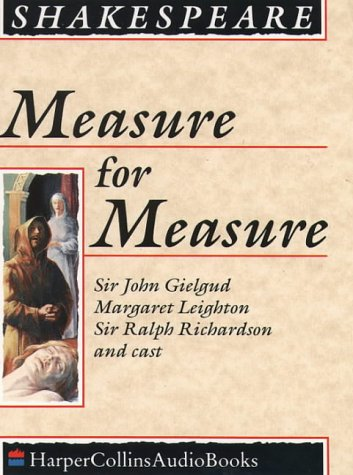

title: The Sherlock Holmes Audio Collection
description: &#34;One thing is certain, Sherlockians, put aside your Baring-GouldAnnotated, your Folio SocietyIllustrated-for the time being, the Oxford is the edition to curl up with on a winter's night&#34;--The Chicago Tribune&#34;An incomparable gift book; or, should you find it impossible to surrender up such treasures, the best of gifts to oneself&#34;--USA Today&#34;To the true Sherlockian, this will be a treasure; to otherwise diverted detective story fans, it is a rich lode for discovery&#34;--Denver Post&#34;The complete and authentic adventures of the legendary detective--expertly edited and annotated by a team of Holmes scholars....in a handsome, boxed set....A lovely gift&#34;--The Christian Science Monitor&#34;Here in nine volumes...are all the adventures of Holmes and Watson. Each book has an introduction, something new and fascinating for even the most devoted Holmesians plus a series of intelligent notes at the back of each v

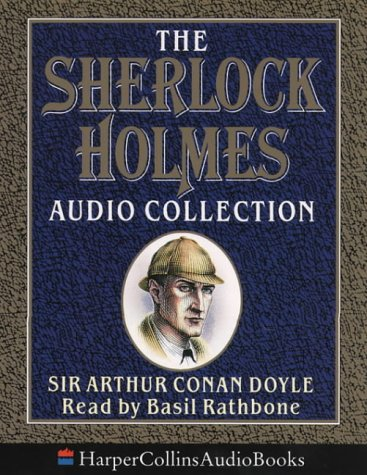

title: Classic Connolly Boxed Set (Vol 1 &amp; 2)
description: [Editor's Note: The following is a combined review with CLASSIC CONNOLLY IN WORDS AND MUSIC.]--Those of you who enjoyed Billy Connolly's moving performance in the film MRS. BROWN may not know (or believe) that he began his professional life as a Glasgow folky and gained first fame as a stand-up comic. Now's your chance to catch up on his sordid past with these compilations from his club recordings of the '70s and '80s. He loves the shaggy dog story and the wicked song but doesn't mind flinging one-liners either. His raucous, scatological, profane humor is best enjoyed by heavy drinkers familiar with the Scottish tongue. The rest of us will get plenty of yuks from those punch lines we can decipher.  Y.R. &copy; AudioFile 2001, Portland, Maine--Copyright &#169; AudioFile, Portland, Maine
image: http://ecx.images-amazon.com/images/I/51M65KR89XL.jpg


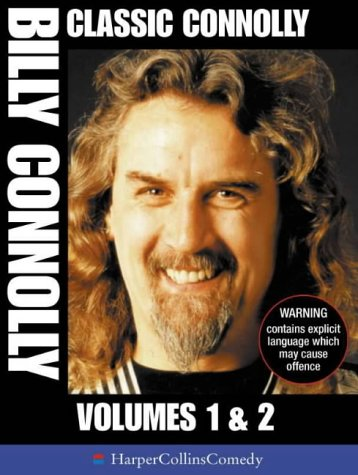

title: War Poems: An Anthology of Poetry from the 18th Cantury to the Present Day
description: Writing poetry has always been a way to express what is going on in the world around us. Unfortunately, sometimes what is around us is war. Acclaimed British actor Paul McGann reads poems that date from the eighteenth century to modern times in this moving audio anthology. McGann is originally from Liverpool, and he still retains a slight Northern accent. Its lilting cadence blends well with the rhythm and worldliness of these powerful poems. Although some of the pieces are well known, others are less so, and this makes the collection even more intriguing for lovers of literature.  R.A.P. &copy; AudioFile 2001, Portland, Maine--Copyright &#169; AudioFile, Portland, Maine
image: http://ecx.images-amazon.com/images/I/51WTKK4V2DL.jpg


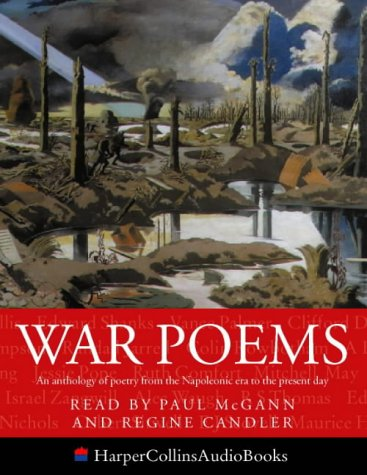

title: As You Like it: Complete &amp; Unabridged
description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.
image: http://ecx.images-amazon.com/images/I/51X8Z6CJ10L.jpg


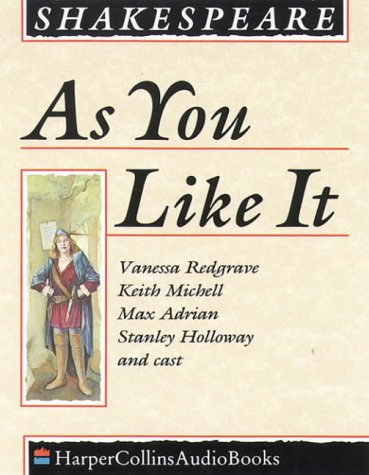

title: Pearl and Sir Orfeo
description: While many readers are familiar with SIR GAWAIN AND THE GREEN KNIGHT (and perhaps even Tolkien's translation), these poems from the same fourteenth-century manuscript are less well known. PEARL the longer of the two, is an elegy for the poet's baby daughter, told in alliterative verse. SIR ORFEO is a Celtic version of the Greek myth of Orpheus and Eurydice, complete with a happy ending that the older story lacks. Terry Jones, former member of Monty Python and a medieval scholar to boot, sounds perfectly comfortable with the rhythms and language. One even gets a taste of the original Middle English on the final side, when Jones puts these works into context by reading Tolkien's own introductions.  D.B. &copy; AudioFile 2001, Portland, Maine--Copyright &#169; AudioFile, Portland, Maine
image: http://ecx.images-amazon.com/images/I/712C-G3XiTL.jpg


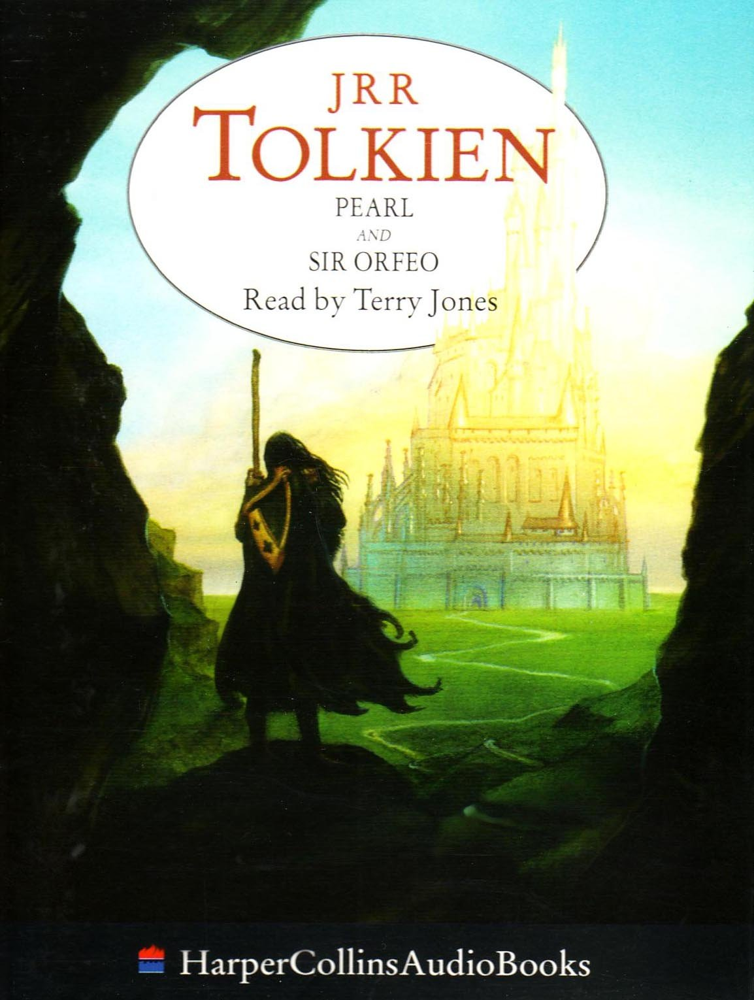

title: Master Georgie
description: Beryl Bainbridge seems drawn to disaster. First she tackled the  unfortunate Scott expedition to the South Pole inThe Birthday Boys; later (but emphatically pre-DiCaprio) came the sinking of the Titanic, inEvery Man for Himself. Now, in her 3rd historical novel (and her 16th overall), she takes on the Crimean War, and the result is a slim, gripping volume with all of the doomed intensity of the Light Brigade's charge--but, thankfully, without the Tennysonian bombast. "Some pictures," a character confides, "would only cause alarm to ordinary folk." There's a warning concealed here, and one that easily disturbed readers would do well to heed:Master Georgieis intense, disturbing, revelatory--and not always pretty to look at.Bainbridge's narrative circles round the enigmatic figure of George Hardy, a surgeon, amateur photographer, alcoholic, and repressed homosexual who counters the dissipation of his prosperous Liverpool life by heading for the Crimean P

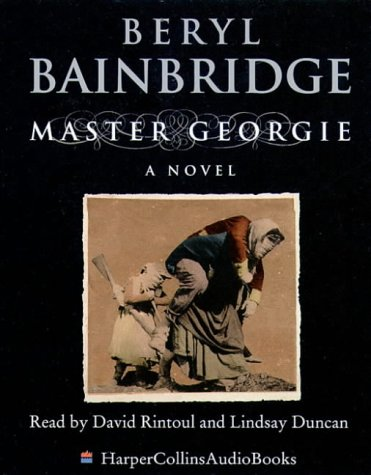

title: Hamlet: Complete &amp; Unabridged
description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.
image: http://ecx.images-amazon.com/images/I/51ZSAPAXN4L.jpg


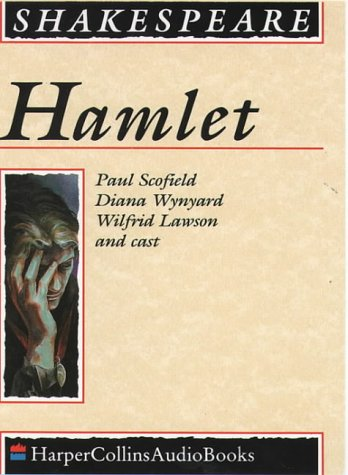

title: One, Two, Guess Who?
description: One, Two, Guess Who? by Colin and Jacqui Hawkins turns counting to 10 into a game. A pair of numbers is presented in a rhyme with a clue: "Who found the slipper left behind on the stairs? The Ugly Sisters said it was theirs." Three choices appear on a flap with the answer underneath, "It was Prince Charming who came to call,/ carrying the slipper last at the ball." Children can go from one to 10 all over again on the last pages, which briefly recap the number rhyme and the objects seen.Copyright 2001 Cahners Business Information, Inc.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51HK6S3HJNL.jpg


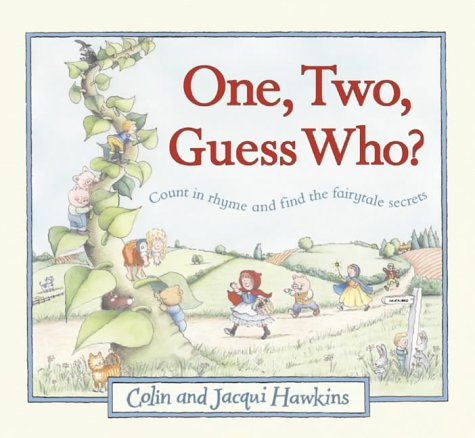

title: Mog's Kittens
description: Judith Kerr&#8217;s best&#8211;selling adventures of that endearing (and exasperating) cat Mog have entertained children for more than 30 years. Now, even infants and toddlers can enjoy meeting this loveable feline. These sturdy little board books&#8212;with their bright, simple pictures, easy text, and hand&#8211;friendly formats&#8212;are just the thing to delight the very young. Ages 6 months&#8211;2 years.
image: http://ecx.images-amazon.com/images/I/514Y3NCWBTL.jpg


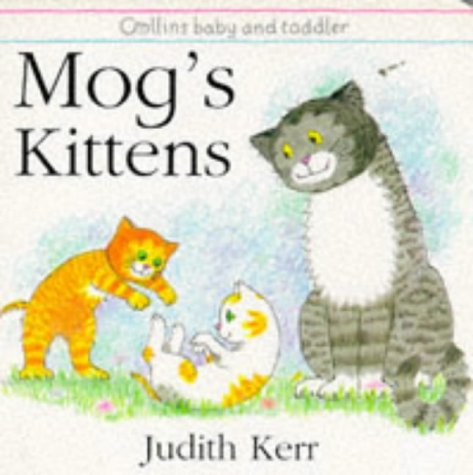

title: The Fatal Strand (Tales from the Wyrd Museum)
description: For lovers of extravagant words and action charged with mystery and passion, Mr Jarvis must be hard to beat.' Times Educational Supplement 'Jarvis creates a rich, intricate world... well worth reading.' The Daily Telegraph 'The best one yet!' 12-yr old fan, Tunbridge Wells
image: http://ecx.images-amazon.com/images/I/516TRJBF9XL.jpg


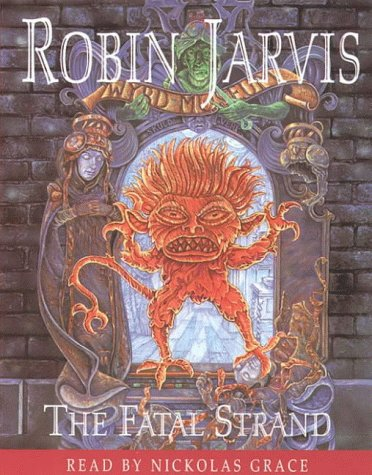

title: Farmer Giles of Ham: And Other Stories
description: 'A fabulous tale of the days when giants and dragons walked the kingdom' Sunday Times
image: http://ecx.images-amazon.com/images/I/51SC9FWR8RL.jpg


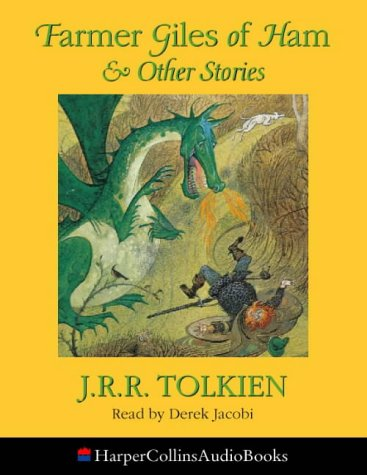

title: The Grass Is Always Greener and Other Stories
description: 'Archer has a gift for plot that can only be described as genius' Daily Telegraph
image: http://ecx.images-amazon.com/images/I/51A4zWHY4QL.jpg


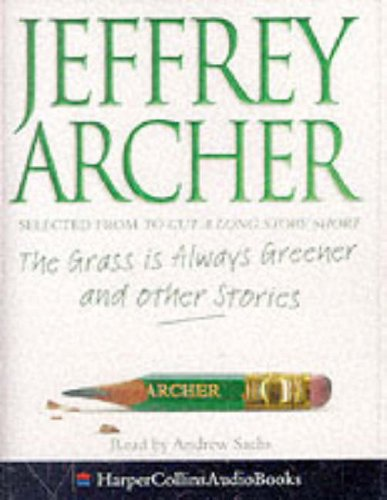

title: I Want My Dinner
description: PreS?A humorous look at manners that's sure to appeal to preschoolers. The book opens as the Little Princess screams, "I want my dinner!" The picture of her red-faced temper tantrum, complete with silverware flying through the air, shows more than the text reveals. Next, she demands her potty (while squeezing toothpaste all over the cat). Finally, she remembers to say the magic word when she requests her teddy bear. Then, on a walk, she encounters a big, red-nosed blue Beastie. He pitches a fit about wanting his dinner, and the Little Princess tells him to say please. The smiling, yellow-crowned child reminds him to say thank you, too. The simple text combined with exuberant, colorful watercolors show Ross at his best. Any child who has been reminded to be courteous will appreciate the cheerful, comical illustrations.?Janet M. Bair, Trumbull Library, CTCopyright 1996 Reed Business Information, Inc.--This text refers to an out of print or unavailable

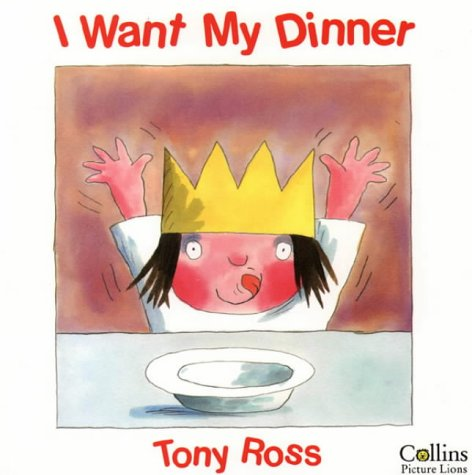

title: The Berenstains' B Book (Bright &amp; Early Books)
description: By Stan Berenstain and Jan Berenstain, Illustrated by Stan Berenstain and Jan Berenstain
image: http://ecx.images-amazon.com/images/I/31hjUxZugDL.jpg


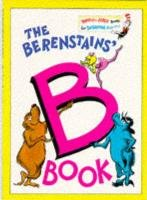

title: The Travels of Doctor Dolittle (Beginner Series)
description: Illus. in full color. The adventures of Dr. Dolittle, the veterinarian who can talk to his patients, have been charming children the world over since 1920. This edition offers the only text especially adapted for beginning readers.&#160;&#160;--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51Q7XxU5OBL.jpg


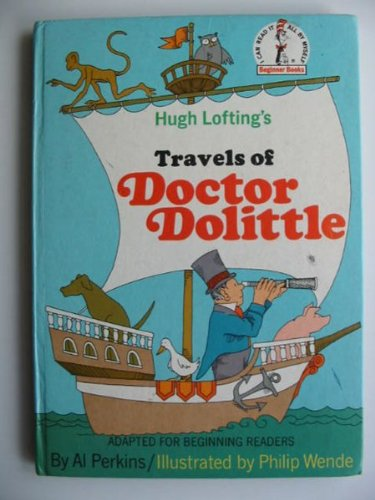

title: The Prophet
description: In a distant, timeless place, a mysterious prophet walks the sands. At the moment of his departure, he wishes to offer the people gifts but possesses nothing. The people gather round, each asks a question of the heart, and the man's wisdom is his gift. It is Gibran's gift to us, as well, for Gibran's prophet is rivaled in his wisdom only by the founders of the world's great religions. On the most basic topics--marriage, children, friendship, work, pleasure--his words have a power and lucidity that in another era would surely have provoked the description "divinely inspired." Free of dogma, free of power structures and metaphysics, consider these poetic, moving aphorisms a 20th-century supplement to all sacred traditions--as millions of other readers already have.--Brian Bruya--This text refers to theHardcoveredition.
image: http://ecx.images-amazon.com/images/I/81ZKLPivYUL.jpg


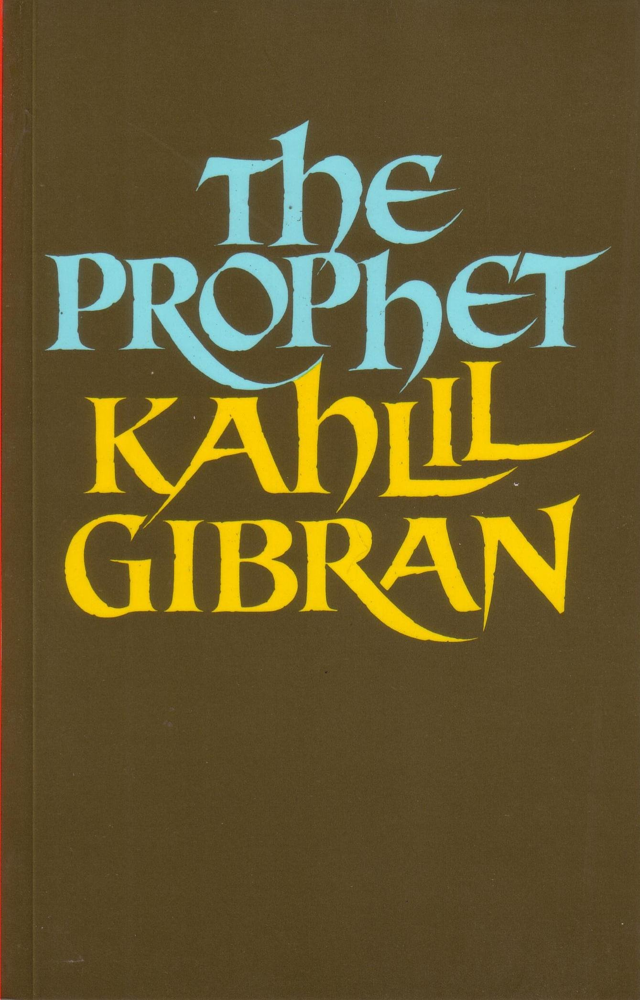

title: Rightly Dividing the Word
description: --This text refers to thePaperbackedition.
image: http://ecx.images-amazon.com/images/I/61KPC59B81L.jpg


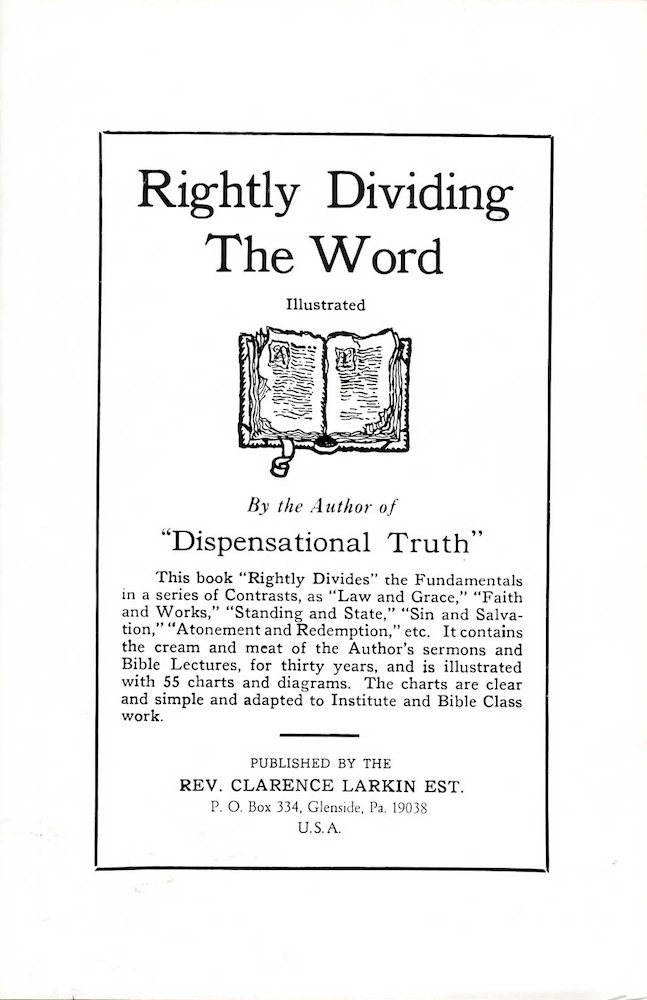

title: Wings on Things (Bright and Early Books)
description: Illustrated in full color. "Wings! Wings! Wings! They are wonderful flying things..." Come join Marc Brown for a wacky, whimsical whirl through the world of winged things. Kids will learn about creatures and things that have wings and - equally as important - those that don't. "Wings are on eagles. Never on beagles. Always on ducks. Never on trucks. Wings on chairs. Never on bears..." Brown's dazzling, bold art perfectly complements his easy-to-read rhyming text giving this spiffy reissue a truly nifty set ofsaleswings!&#160;&#160;--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51RA5485J4L.jpg


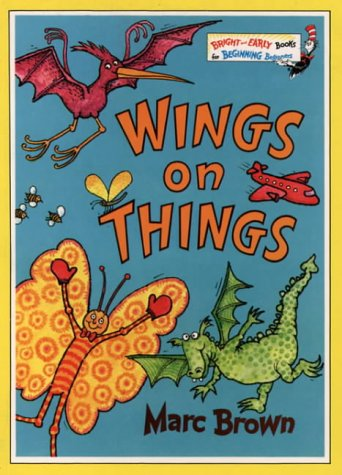

title: Spring Story (Brambly Hedge)
description: "!the most researched-crammed fantasy ever set before small children!" Sunday Times Magazine
image: http://ecx.images-amazon.com/images/I/61qIWAs9HxL.jpg


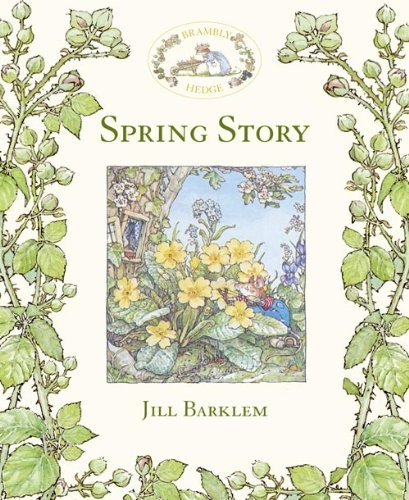

title: Mog and Me (Mog the Cat Board Books)
description: &#8220;Soft pastel illustrations lend a friendly, calm feeling to the adventures.&#8221; --Publisher Weekly
image: http://ecx.images-amazon.com/images/I/51NRP9JWN3L.jpg


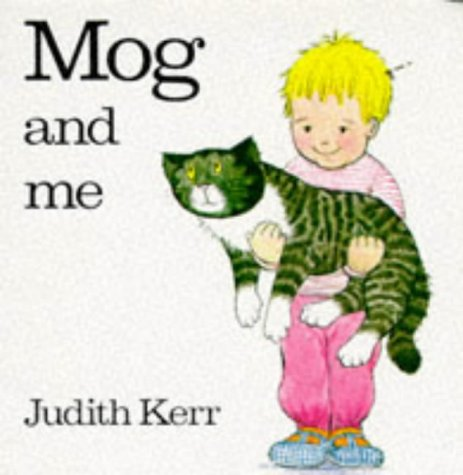

title: Autumn Story Brambly Hedge
description: "!the most research-crammed fantasy ever set before small children!" Sunday Times Magazine
image: http://ecx.images-amazon.com/images/I/61SVJoaIhlL.jpg


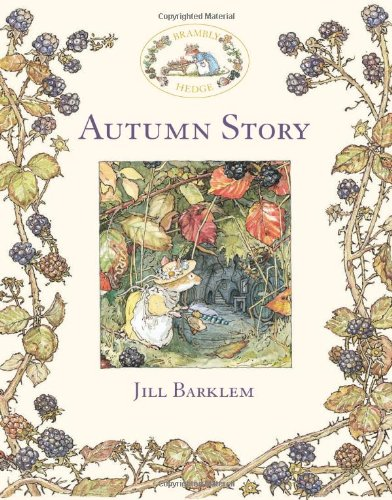

ignore ingestion exception
title: A Treasury of Narnia
description: "The magic of C. S. Lewis's parallel universe never fades," The Times
image: http://ecx.images-amazon.com/images/I/61MH3TCT6ZL.jpg


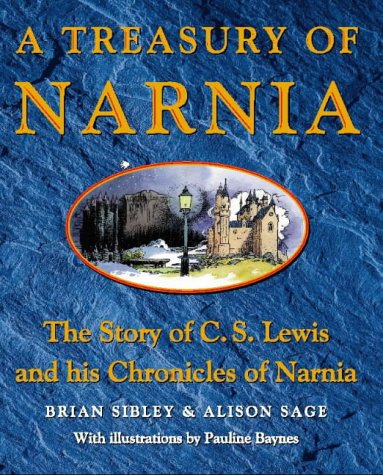

ignore ingestion exception
title: The Very Bad Bunny (Beginner Series)
description: By Marilyn Sadler, Illustrated by Roger Bollen
image: http://ecx.images-amazon.com/images/I/51TQrn6vfmL.jpg


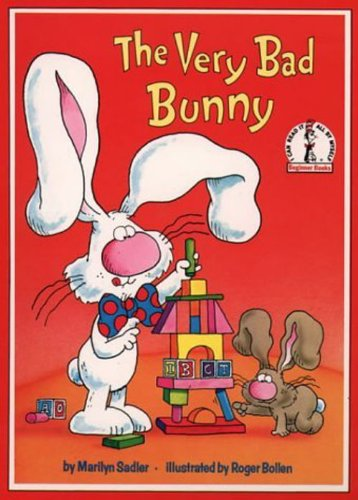

title: Ballad of Favour
description: Great granddaughter to Charles Dickens, Monica (1915-1992) was born into an upper middle class family. Disillusioned with the world in which she was brought up, she acted out - she was expelled from St Paul's Girls' School in London for throwing her school uniform over Hammersmith Bridge. Dickens then decided to go into service, despite coming from the privileged class; her experiences as a cook and general servant would form the nucleus of her first book, One Pair Of Hands, published in 1939. Dickens married an American Navy officer, Roy O. Stratton, and spent much of her adult life in Massachusetts and Washington D.C., but she continued to set the majority of her writing in Britain. No More Meadows, which she published in 1953, reflected her work with the NSPCC  - she later helped to found the American Samaritans in Massachusetts. Between 1970 and 1971 she wrote a series of children's books known as The Worlds End Series which dealt with rescuing 

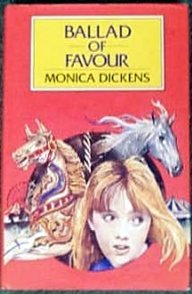

title: The Treasure Hunt (Percy the Park Keeper)
description: The Rescue Party:&#x2018;&#x2026;it&#x2019;s good for reading aloud to under-fives, and later the six-pluses will still want to read it themselves.&#x2019; The Independent on SundayAfter the Storm:&#x2018;&#x2026;look no further for the best present for any child from two to six.&#x2019; Susan Hill, The Sunday TimesPercy&#x2019;s Bumpy Ride:&#x2018;Imaginatively detailed illustrations and just the right amount of suspense.&#x2019; Practical ParentingOne Snowy Night&#x2018;A heartwarming bedtime tale&#x2026;&#x2019; Susan Hill, The Independent--This text refers to thePaperbackedition.
image: http://ecx.images-amazon.com/images/I/515N1PSRV4L.jpg


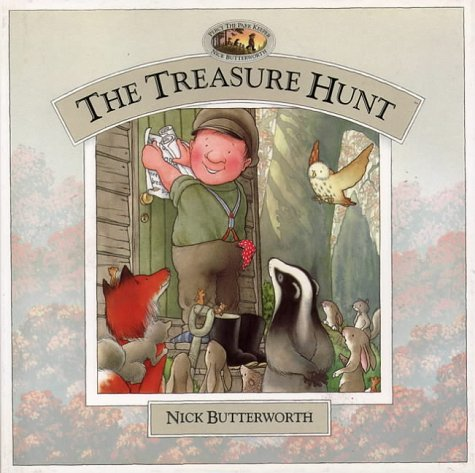

title: Mog's Family of Cats
description: &#8220;Soft pastel illustrations lend a friendly, calm feeling to the adventures.&#8221; --Publisher Weekly
image: http://ecx.images-amazon.com/images/I/513HM15VZEL.jpg


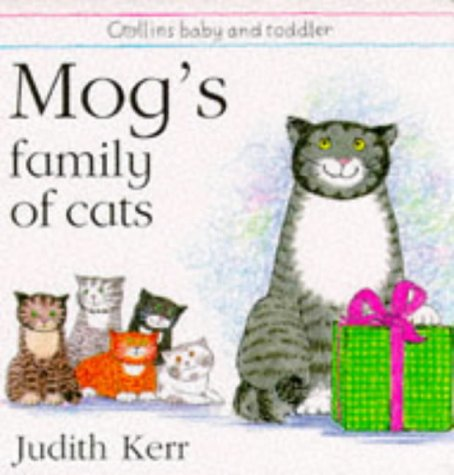

title: Deathscent (Intrigues of the reflected realm)
description: About The Raven's Knot: This book is mind-blowing, shocking and pretty darn good! Firstly I would just like to say that I love Robin Jarvis anyway, he is great... it was full of suspense and surprises. Jarvo rocks, may he write books for ever! Reader from Chester, Amazon.co.uk
image: http://ecx.images-amazon.com/images/I/51NCTA96XJL.jpg


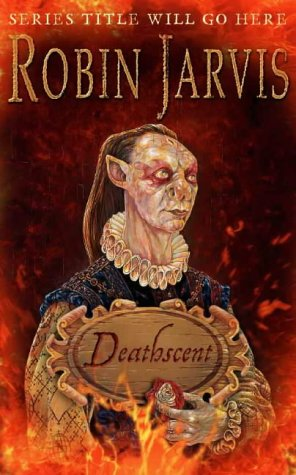

title: Dictionary in French (Beginner Series)
description: With his unique combination of hilarious stories, zany pictures and riotous rhymes, Dr. Seuss has been delighting young children and helping them learn to read for over fifty years. Creator of the wonderfully anarchic Cat in the Hat, and ranked among the UK's top ten favourite children's authors, Dr. Seuss is a global best-seller, with over half a billion books sold worldwide.
image: http://ecx.images-amazon.com/images/I/51B61PVDAXL.jpg


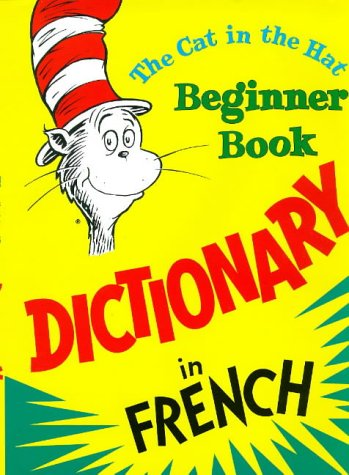

title: Outings for the Mice of Brambly Hedge: &quot;Spring Story&quot;, &quot;High Hills&quot;
description: Jill Barklem was born in Epping in 1951. After an accident when she was thirteen, Jill was unable to take part in PE lessons and instead developed her talent for drawing and art. Later, she studied illustration at St Martin's in London. Jill is now a full-time illustrator, working on the series of Brambly Hedge books.
image: http://ecx.images-amazon.com/images/I/61C1PXFXW0L.jpg


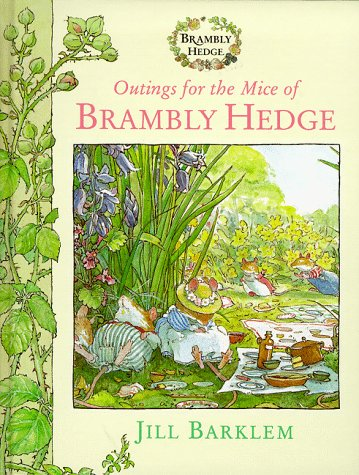

title: My ABC Dictionary (Collins Children's Dictionaries)
description: A member of the society of Authors, with over 60 title to her name, Irene Yates as also written for theTimes Education Supplement, Scholastic Teacher's Magazine and BBC Schools' Radio. An expert in literacy and language development, she became a writing member of the first SCAA KS1 Test Development Team, and contributed to the Reading Tests in 1995,1996 and 1997. She also visits schools regularly as a Writer and Poet, and runs teacher training days in all aspects of language development, particularly literacy.
image: http://ecx.images-amazon.com/images/I/7123R964SWL.gif


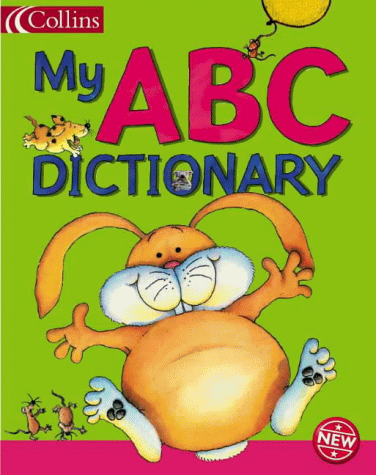

title: The Lion, the Witch and the Wardrobe (The Chronicles of Narnia)
description: Born to a coal-mining family in 1945, Robin Lawrie emigrated to Canada in 1953 and lived in Vancouver till 1968. Returning then to Britain, his freelance career as an illustrator and occasional author has continued until the present day.  He now lives in the Shorpshire hills with his wife and two children and tries to divide his time between the demands of freelance work, a young family, and restoring an ancient timber-framed farmhouse.
image: http://ecx.images-amazon.com/images/I/51P0HXJ9GSL.jpg


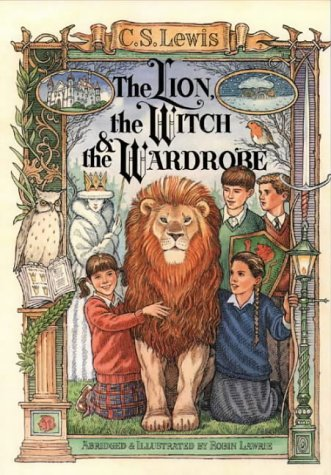

title: Baby Mice in Brambly Hedge: &quot;Summer Story&quot;, &quot;Poppy's Babies&quot;
description: Jill Barklem was born in Epping in 1951. After an accident when she was thirteen, Jill was unable to take part in PE lessons and instead developed her talent for drawing and art. Later, she studied illustration at St Martin's in London. Jill is now a full-time illustrator, working on the series of Brambly Hedge books.
image: http://ecx.images-amazon.com/images/I/61ZAT6K14XL.jpg


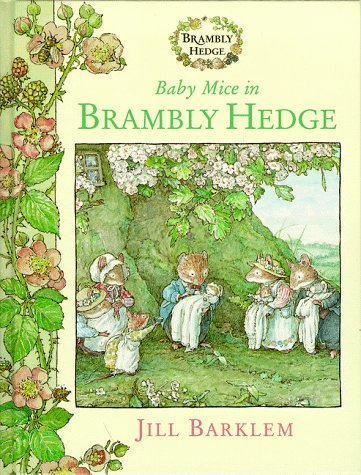

title: Nice for Mice
description: Jill Barklem was born in Epping in 1951. After an accident when she was thirteen, Jill was unable to take part in PE or games at school and instead developed her talent for drawing and art. On leaving school, she studied illustration at St Martin's in London. Jill is now a full-time illustrator, working on the series of Brambly Hedge books.
image: http://ecx.images-amazon.com/images/I/51H2XC7QEZL.jpg


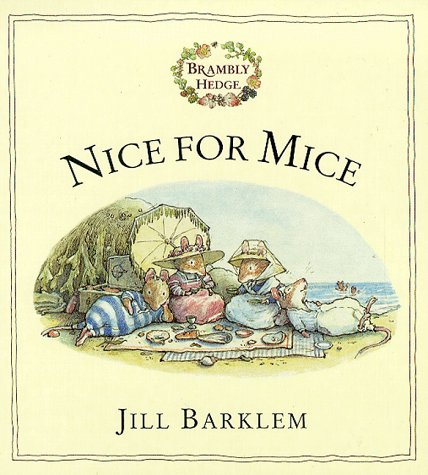

title: The Story of the Wandering Hedgehog (Little Grey Rabbit Classic Series)
description: Alison Uttley was born in 1884 in Derbyshire. She wrote about her characters, "Why do children love them? Because I believe in them." And it is easy to imagine that just over the next hill, little Grey Rabbit, quick Squirrel, bold Hare, kind Moldy Warp and little Fuzzypeg really are all going about their business.
image: http://ecx.images-amazon.com/images/I/41XJZPNGV9L.jpg


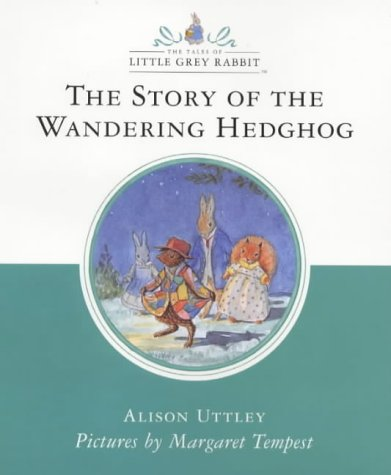

title: House for a Mouse
description: Jill Barklem was born in Epping in 1951. After an accident when she was thirteen, Jill was unable to take part in PE lessons and instead developed her talent for art. Later, she studied illustration at St Martin's in London. Jill is now a full-time illustrator, working on the series of Brambly Hedge books .
image: http://ecx.images-amazon.com/images/I/51N62HQ36DL.jpg


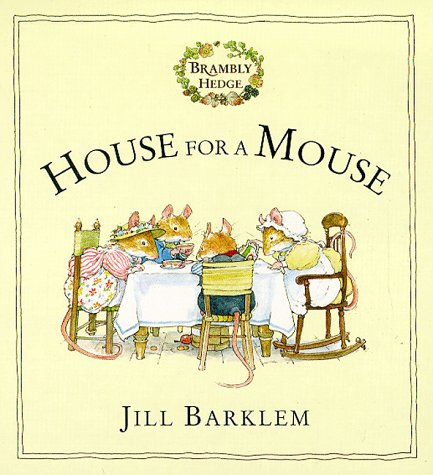

title: The Book of Revelation
description: American Baptist pastor, Bible teacher, and writer, Clarence Larkin was born October 28, 1850, in Chester, Delaware County, Pennsylvania. He was converted to Christ at the age of 19 and then felt called to the Gospel ministry, but the doors of opportunity for study and ministry did not open immediately. He then got a job in a bank. When he was 21 years old, he left the bank and went to college, graduating as a mechanical engineer. He continued as a professional draftsman for a while, then he became a teacher of the blind. Later, failing health compelled him to give up his teaching career. After a prolonged rest, he became a manufacturer. When he was converted he had become a member of the Episcopal Church, but in 1882,he became a Baptist and was ordained as a Baptist minister two years later. He went directly from business into the ministry. His first charge was at Kennett Square, Pennsylvania; his second pastorate was at Fox Chase, Pennsylvan

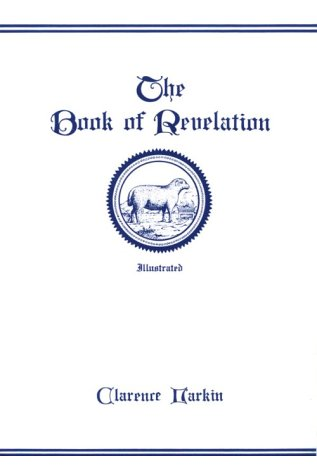

title: Little Grey Rabbit Goes to the Sea (Little Grey Rabbit Classic Series)
description: Alison Uttley was born and brought up on a farm in Derbyshire at the end of the 19th century. Her Little Grey Rabbit series has delighted generations of children. Her love of country life -- gathering spring flowers, picnicking in summer meadows and skating on frozen ponds -- comes through vividly in her stories.
image: http://ecx.images-amazon.com/images/I/717T9EBQRCL.gif


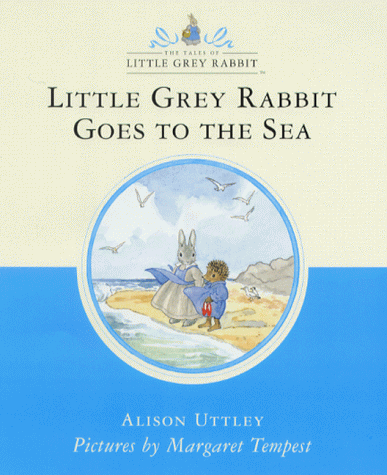

title: Fatal passage: The untold story of John Rae, the Arctic adventurer who discovered the fate of Franklin
description: "In Ken McGoogan's artful telling, John Rae emerges from the shadows to take his place among the most intriguing of the 19th century Arctic explorers. This is delightful reading" -- Andrea Barrett, author The Voyage of the Narwhal "A riveting story - backed by sold research - that illuminates a fascinating chapter in the annals of Arctic exploration" Wall Street Journal "An overdue book that makes an important contribution to Arctic exploration history and yet remains compulsively readable for the non-specialist" Quill & Quire "A riveting story of courage and determination, high adventure and imperial ambition... Excellent" Historical Novels Review "A tale of ambition and high adventure... a passionate redemption of Rae's rightful place in history" Edinburgh Times--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-am

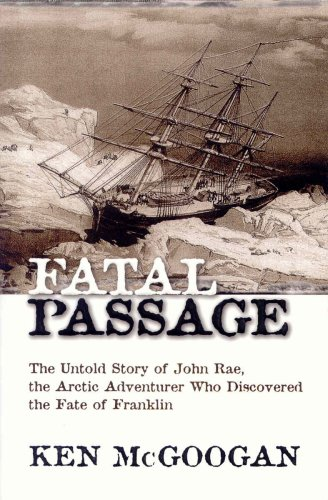

title: Pirates
description: Colin Hawkins was educated at art school in the north of England and then worked as an illustrator/designer for the Daily Express before becoming an illustrator for magazines and advertising. He began to illustrate children's books in 1978, and from 1979 onwards he has created his own children's books with his wife, Jacqui, who also studied graphic design at college. They both share the desire to "make children's books funnier".--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51WN7BJMJSL.jpg


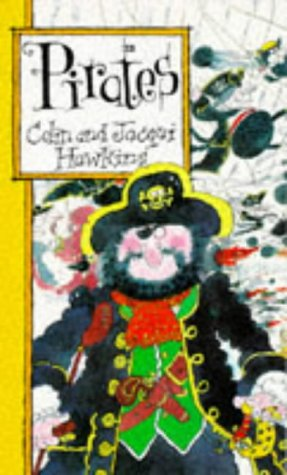

title: Mog's Bad Thing
description: Author and artist Judith Kerr creates another installment in the adventure series begun 30 years ago with Mog the Forgetful Cat, Mog's Bad Thing. Debbie's plan to host a cat show in their yard disrupts Mog's routine and causes the feline a great deal of anxiety so much so that she has an accident on Mr. Thomas's favorite chair (and nearly misses the contest).Copyright 2001 Cahners Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/416MEAEJ3WL.jpg


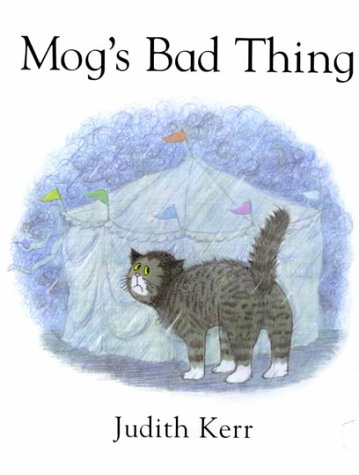

title: Go, Dog. Go! (Beginner Series)
description: By P. D. Eastman, Illustrated by P. D. Eastman
image: http://ecx.images-amazon.com/images/I/51NH4PXHR6L.jpg


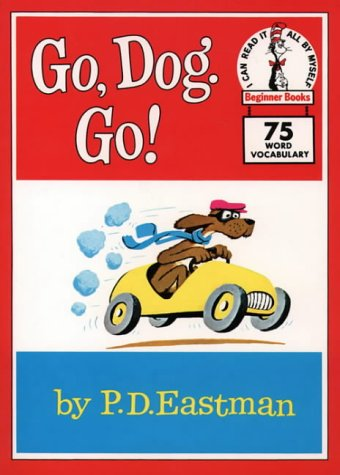

title: Once There Was a House and You Can Make it
description: A cardboard box becomes a house with "roof," "chimney" and "porchlight," made from more cardboard and other objects. With the addition of another house (this time with a stove, table and sink), a gas station and a car, an army of children can play "town." Instructions help readers create their own little houses from ordinary household items items that normally would be thrown away but here become working parts of an ingenious little city. Both story and guide sections have pictures jammed with cheerful children, in cartoon-bright colors, using bottle lids for knobs, mailing tubes for posts and pliers made from clothespins, and safety precautions are stressed. This book is an invitation to be creative, and it's easy to see there's really no limit to what can be accomplished with the ideas in this book. Ages 3-6.Copyright 1987 Reed Business Information, Inc.--This text refers to thePaperbackedition.
image: http://ecx.images-a

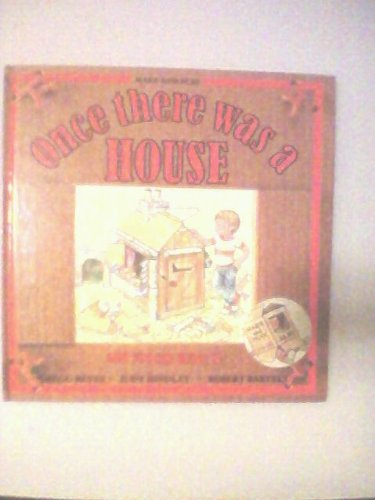

title: Summer Story (Brambly Hedge)
description: "...the most researched-crammed fantasy ever set before small children..." Sunday Times Magazine
image: http://ecx.images-amazon.com/images/I/614-rvKEk%2BL.jpg


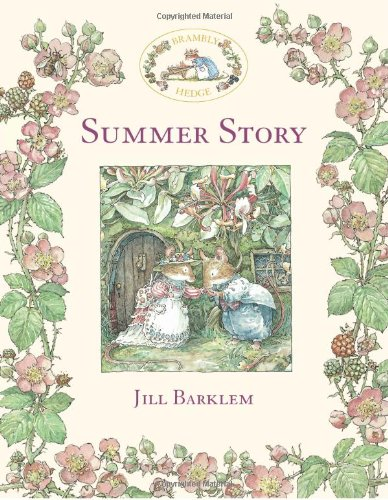

title: Curl to Win
description: The essential guide for all curlers - from novice to elite.Whether you&#8217;re stepping into the hack for the first time, looking to improve your delivery or better understand strategy,Curl to Winwill help take your game to the next level. Renowned for his ability to blend the mental and physical aspects of curling as well as his innovative and effective strategies, Russ Howard has written a practical handbook that no curler should be without.Olympic gold-medallist and Russ Howard has won a record 107 Brier wins, multiple World Championships, and helped invent the Free Guard Zone that has been adopted worldwide Canada&#8217;s &#8220;curler of century&#8221;, Russ coaches curling teams around the world.--This text refers to an alternateHardcoveredition.
image: http://ecx.images-amazon.com/images/I/51maFVNwO7L.jpg


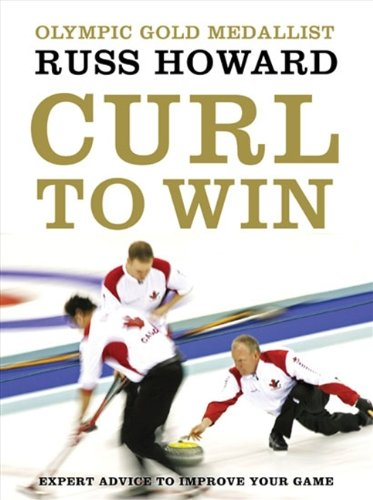

ignore ingestion exception
title: In the Shadow of Man
description: "An instant animal classic."   --Time"Apart from its enormous scientific value, IN THE SHADOW OF MAN is absolutely fascinating to read as a story of discovery . . . The whole book is enthralling."  --Boston Globe"I can't imagine a more vivid or unexpectedly moving introduction to chimpanzees in the wild than Jane Goodall's." -- George Stade  --The New York Times"Jane Goodall's work with chimpanzees represents one of the Western world's great scientific achievements."   --Stephen Jay Gould--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51iMi0zYqeL.jpg


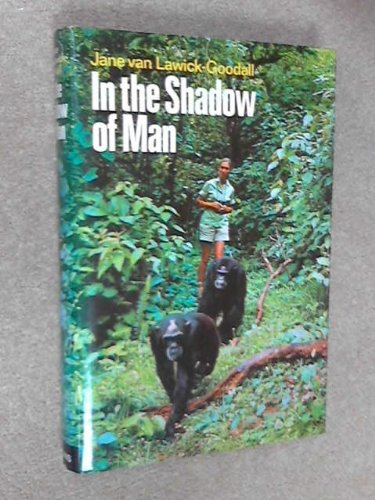

title: Apple A Day: The Myths, Misconceptions and Truths About the Foods We Eat
description: Widely known in Canada from hisMontreal Gazettecolumn, and work with the Discovery Channel, Schwarcz (Let Them Eat Flax) is an entertaining guide through the tangle of conflicting research studies, advertising claims, special interest groups, age-old myths and popular opinion that make diet a cloudy subject. In short chapters he aims his microscope at such highly touted foods as tomatoes, acai berries, curry and soy; additives like nitrites, artificial sweeteners, vitamins and fluoride; contaminants including pesticides, hormones, trans fats and dioxins; and what, for him, are suspect fads. Schwarcz contends that while there are no magical foods, a diet of mostly vegetables, fruits, whole grains and low-fat dairy products and moderation are key to good health. To help readers make informed choices, he ably cuts through many controversies and will likely stir up a few (he challenges those who co

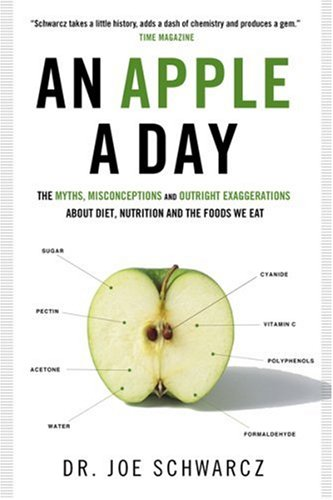

title: I'll Teach My Dog 100 Words (Bright and Early Books)
description: Illus. in full color. Beginning readers can learn 100 different words in this story about a remarkable dog.&#160;&#160;--This text refers to theHardcoveredition.
image: http://ecx.images-amazon.com/images/I/51HESAR69TL.jpg


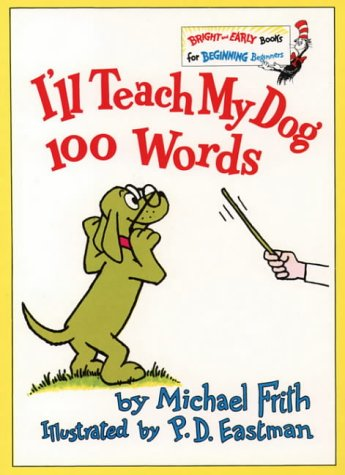

title: Dear Olly
description: Michael Morpurgo MBE is one of Britain's best-loved writers for children. He has written over 100 books and won many prizes, including the Smarties Prize, the Blue Peter Book Award and the Whitbread Award. His recent bestselling novels include 'Shadow', 'A Medal for Leroy' and 'Little Manfred'.           His novel 'War Horse' has been successfully adapted as a West End and Broadway theatre play and a major film by Steven Spielberg. A former Children's Laureate, Michael is also the co-founder, with his wife Clare, of the charity Farms for City Children.--This text refers to theDigitaledition.
image: http://ecx.images-amazon.com/images/I/51B%2B9TmgFzL.jpg


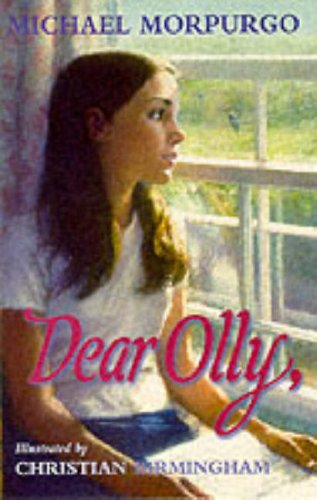

title: The Jews in America
description: A glossy, predictable paean to American Jewry by the producers of the Day in the Life series, this oversize collection of photographs traverses the country, capturing cowboys and Soviet Jewry activists, magicians and roving rabbis. The belabored point here is that Jews have special customs--circumcision, bar mitzvah, Passover seder--that set them apart, but Jews are also as American as apple pie. Hence, many of the 197 pictures, most of them color, reiterate that Jews are just regular folk: there are cozy multigenerational shots and photos of Jewish doctors, astronauts, hikers, soldiers, prisoners, casket-makers, emotionally disturbed youth. Cohen, co-editor of Christmas in America , plays up a familiar ethnic focus on food and stardom (a photograph of Steven Spielberg and his mom, Leah Adler, who owns a kosher L.A. restaurant, combines the two themes). A picture of the Jewish attorneys of a Century City law firm smacks of ghettoization and one o

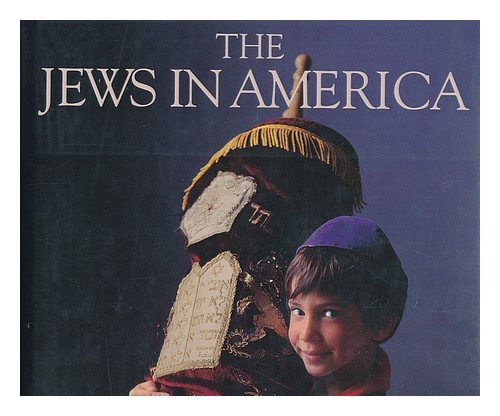

title: The companion guide to Rome
description: Can rightly be called a classic... the definitive historical and cultural account of the city... it inspires complete faith  SUNDAY TELEGRAPH (4/00)  The best guide to Rome  SEAN SWALLOW, TRAVEL BOOKSHOP  (7/98) The best guide to Rome published for many a long year  SUNDAY TIMES  Masson writes elegantly and with warmth, and knows her subject inside out  SUNDAY TELEGRAPH--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/41MYxeXQ0cL.jpg


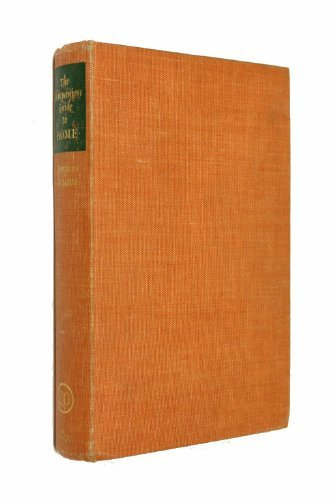

title: Bloomer: The Dog You Can Play With!
description: Youngsters can take the star of Bloomer by Mandy Stanley, attached by a red string and Velcro spots, and move the pooch into different scenes throughout this oversize board book. Each activity, whether it be breakfast or bath time, offers accessories (e.g., a bone, a sponge and a scrub brush), also attached by ribbons and Velcro, for children to remove and work with.Copyright 2001 Cahners Business Information, Inc.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/517P0RMQYVL.jpg


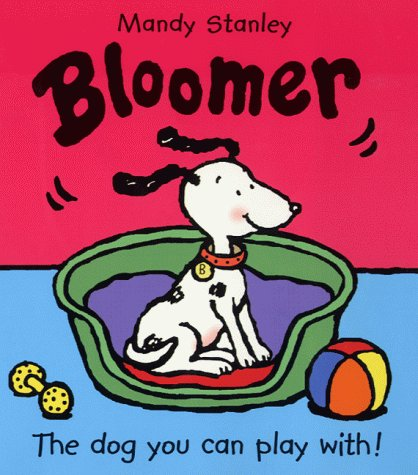

title: The Art of Adventure
description: Rowell's panoramic shots of mountains--and the climbers and skiiers upon them--are well suited to the oversized format of this extravagant volume. One hundred and twenty seven color photographs allow vicarious adventurers to traverse the 285 miles of the Karakoram range in the Himalayas, freeclimb "Astroman," a 1400-foot overhang on the eastern exposure of Washington Column in Yosemite Valley and circumnavigate Alaska's Mt. McKinley on skis. Most of the photos seen here are skillfully executed, exciting pictures of romantic action in obscure locations. And in several instances, Rowell ( Mountain Light ) has captured something magical: a shot of dawn on the Serengeti; an avalanche in full stride near McKinley; a rainbow emanating from Lhasa's Potala Palace in Tibet.Copyright 1989 Reed Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/41Pd7NY5DFL.jpg


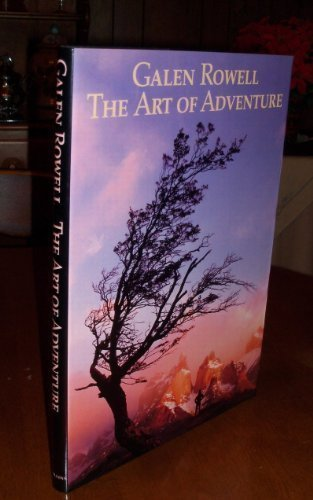

title: Pookie Believes in Santa Claus
description: Another popular character makes an appearance in Pookie Believes in Santa Claus by Ivy Wallace. Young and old alike will delight in the nostalgic illustrations, first published in the U.K. in 1953 and newly available in the U.S.Copyright 2001 Cahners Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/51BF081P82L.jpg


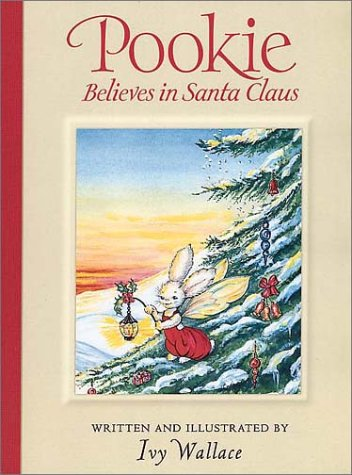

title: Illustrissimi: The Letters of Pope John Paul I
description: Text: English, Italian (translation)
image: http://ecx.images-amazon.com/images/I/51MTj9fVVAL.jpg


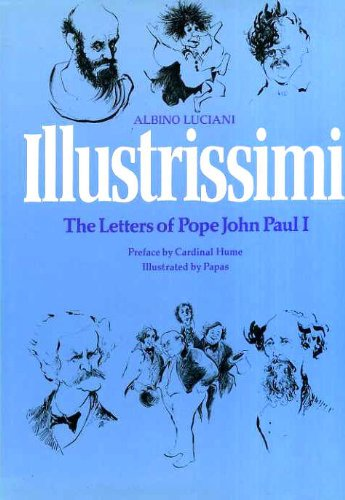

title: On Happiness, U.S. Edition
description: Text: English, French (translation)
image: http://ecx.images-amazon.com/images/I/414GNcYil1L._SL500_.jpg


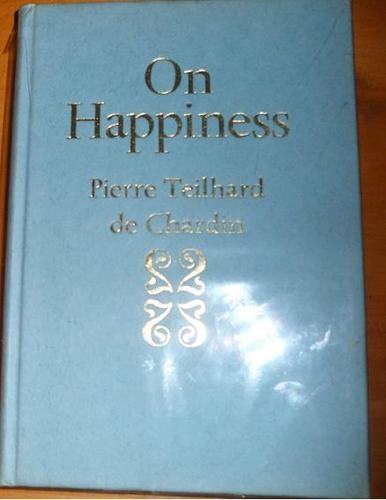

title: Infallible? An Inquiry
description: Text: English (translation)Original Language: German
image: http://ecx.images-amazon.com/images/I/41hUW0dRtcL.jpg


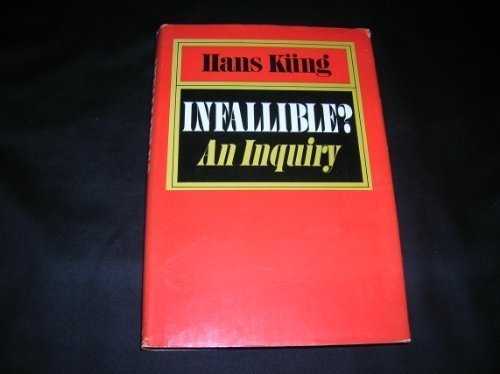

title: Soames on the Range
description: Grade 7&#8211;10&#8212;San Francisco Soames has never had a "normal" family. He and his siblings are named after places, his twin sisters are always getting into trouble, and his parents are former hippies. But things take a turn for the worse in their small Vermont town when his parents inform him that his father is gay. A homophobic bullying incident outside a pharmacy, in which the store's owner attempts to protect Cisco with a shotgun, turns ugly and the next thing Cisco knows, he's responsible for putting Mr. Patterson in a coma. In an attempt to give their son a fresh start, the boy's parents send him to his Uncle Vincent's ranch in middle-of-nowhere British Columbia, but Cisco's fate doesn't immediately improve upon landing on Canadian soil. He appreciates cooking and eating good food, but his uncle's moose stew is barely edible. Belgue excels at capturing the realities of small-town life. Likewise, details of the Canadian wilderness will 

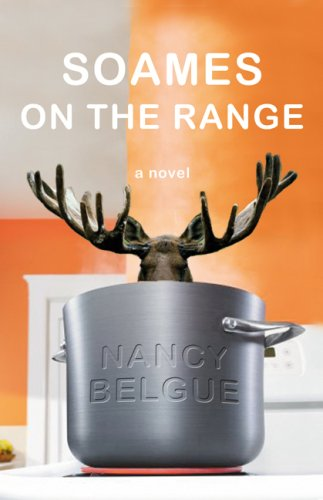

title: France: The Beautiful Cookbook- Authentic Recipes from the Regions of France
description: Though at first glance too luscious for the pots, pans and grease stains of the kitchen, this opulently illustrated oversize volume--travel book as much as recipe collection--can function there admirably, seducing the hungry and the restless. The latest in the publisher's series of regional cookbooks (others on Italy, China and Asia have preceded it), it will keep readers turning pages even if they never pick up a saucepan. Chapters alternate between discussing the different regions of France and offering a good selection of traditional recipes. French-born authors and cooks Marianne Comolli, Elisabeth Scotto and Michele Carles reflect on the history and geography of France with appetizers from Provence, entrees from Lyonnais and desserts from Anjou. This is hearty, not haute , cuisine: well-organized recipes are scaled for the average cook, who won't have to go in search of rare ingredient

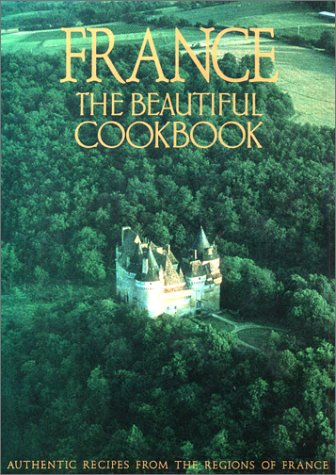

title: Younghusband: The Last Great Imperial Adventurer
description: &#8220;A glorious biography&#8212;they don&#8217;t come any more enjoyable than this.&#8221; --Jan Morris, Independent&#8220;Breathtakingly accomplished&#8230; One of the year&#8217;s most thrilling biographies.&#8221; --The Observer--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51frAAbdkjL.jpg


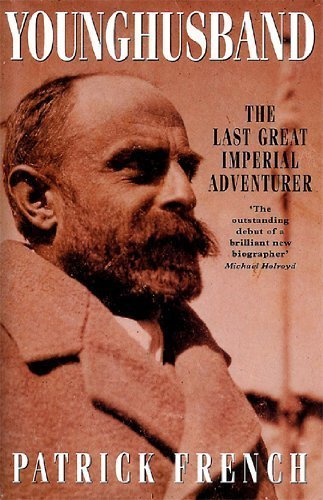

title: Mexico The Beautiful Cookbook: Authentic Recipes from the Regions of Mexico
description: The latest addition to this popular series is a colorful guide to Mexico's diverse regional cuisine. Palazuelos is an experienced chef/caterer, and her recipes are inviting, her headnotes informative; Ignacio Urquiza's photographs of the food are eyecatching but uncontrived. There are many unusual dishes here, both traditional and contemporary, and most are far more sophisticated than the Tex-Mex fare many Americans identify as Mexican food. A good companion to Patricia Quintana's The Taste of Mexico ( LJ 12/86); recommended for most collections.Copyright 1991 Reed Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/5159ZN5BGAL.jpg


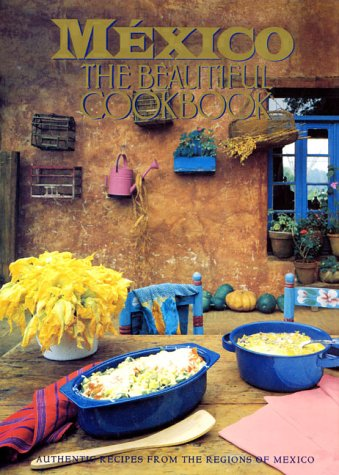

ignore ingestion exception
title: A Day in the Life of China
description: Ninety photographers (60 Western, 30 Chinese) fanned out across China on a single day--April 15, 1989--to take the pictures that make up this rare, candid glimpse of the world's most populous nation. The photos show us villages and farms and take us into homes, schools and factories. From a kaleidoscope of images--rice-planting brigades, a defendant in the dock on trial for murder, yaks on Main Street in one city--we get a feel for the contradictions and pressures of a modernizing society. Many of the photos are exceptionally beautiful; taken together, they reveal the diversity of this vast country, moving from the tent-like yurts of Mongolian nomads to a Tantric Buddhist monastery in occupied Tibet. The photo-essay concludes with a glimpse of protest posters that went up at Beijing University as students began to occupy Tiananmen Square, a tragically ironic conclusion in light of events that followed. First seri

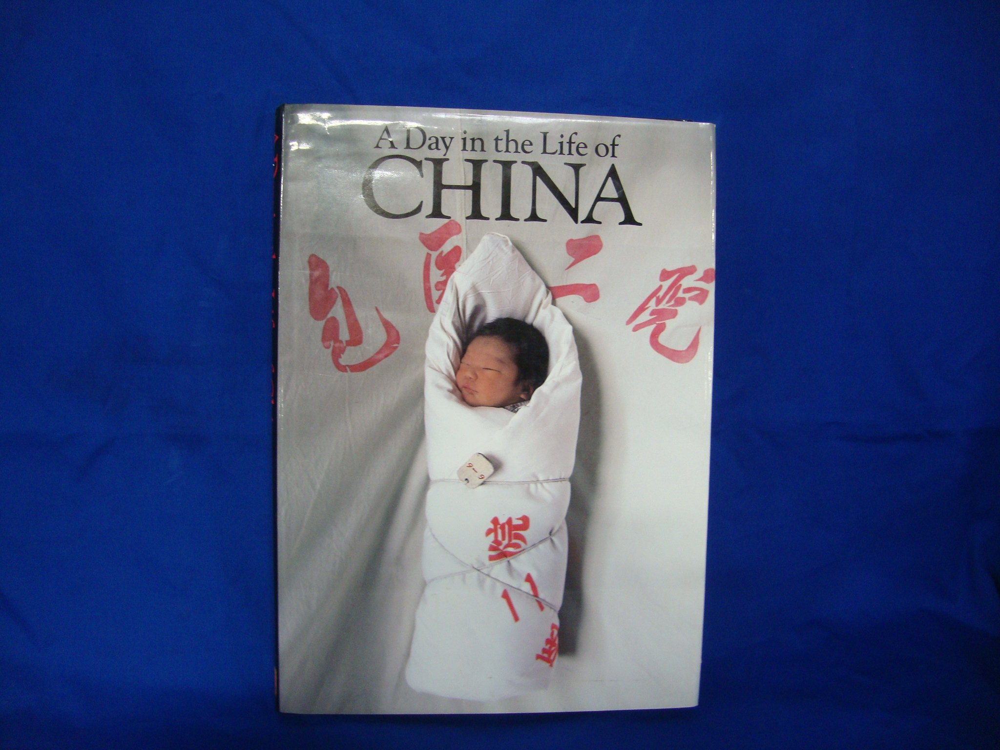

ignore ingestion exception
title: America: The Beautiful Cookbook
description: Fifth in the series that includes the best-selling Italy the Beautiful (Knapp, 1988) and France the Beautiful ( LJ 10/15/89), this big picture book features traditional recipes from around the country, very brief introductions to the various regions, and lots of color photographs. Recipes--grouped by courses of a meal rather than region--give little sense of regional identity; most are familiar and available elsewhere; the blown-up food photographs are more interesting than the postcard views of the country. Buy for demand. Better Homes & Gardens Book Club selection.Copyright 1990 Reed Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/21DVRx7iZ0L.jpg


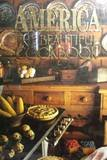

title: Mr. Balfour's Poodle: Peers Versus People
description: Elected to Parliament as a Labour member in 1948, Jenkins (1920- 2003) served in several major posts in Harold Wilson's First Government and as Home Secretary from 1965-1967. In 1987, Jenkins was elected to succeed Harold Macmillan as Chancellor of the University of Oxford following the latter's death, a position he held until his death. Jenkins grew to political maturity during the twilight of a great age of British parliamentary democracy. As much as Churchill, though in quite a different way, Jenkins has been from the cradle a creature of the system that nurtured Palmerston and Disraeli, Gladstone, Asquith and Lloyd George.--This text refers to an alternatePaperbackedition.
image: http://ecx.images-amazon.com/images/I/51pNNI263lL.jpg


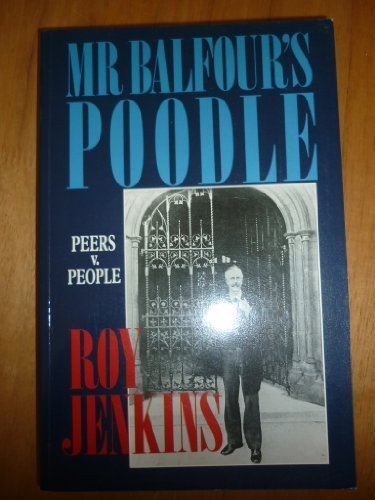

title: California, The Beautiful Cookbook: Authentic Recipes from California
description: Two collections of California's best. The latest addition to Collins's popular series ( America the Beautiful Cookbook, LJ 11/15/90; France the Beautiful Cookbook, LJ 10/15/89; et al.) is a locally specialized but stunning entry. The photographs of the California scenery/scene are varied and vivid, while the food photography is quite spectacular, and the recipes are far better and more interesting than those in several of the previous books. Recommended for most California libraries, and for any others that can afford this luxury. Like Robert Schneider's The Open Hand Cookbook ( LJ 11/15/89), the San Francisco Symphony's benefit cookbook offers a tantalizing collection of menus from some of California's most talented chefs. The roster of Bay Area contributors includes Jeremiah Tower, Alice Waters, Barbara Tropp, Ken Hom, and many other stars; many of the recipes are unmistakably "California," but 

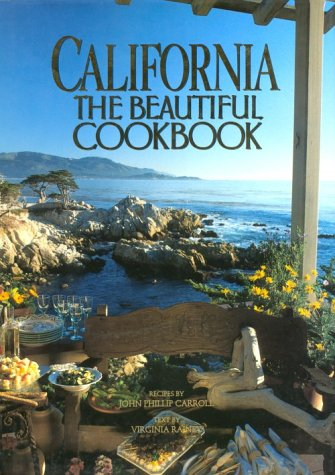

title: A Day in the Life of Italy: Photographed by 100 of the World's Leading Photojournalists on One Day, April 27, 1990 (Day in the Life Photography Series)
description: Tenth in the Day in the Life series, this photographic impression of il bel paese and its people comprises some 200 shots taken by 100 international photographers, spread throughout the country, on April 27, 1990. From pictures of fashion models primping in Milan to glassblowers working on the island of Murano, from interiors of St. Peter's in Rome to gypsies gathered around a campfire in Sardinia, the photos reveal Italy's varied lifestyles--urban and rural, moneyed and not, up-to-date and ageless. Wisely focussing, for the most part, on people, the shots, arranged one or two to a page, are accompanied by brief captions and a locating map, and the photographer's credit. Affectionate and lively, the pictures generally eschew sensationalistic angles and perspectives for direct, upbeat views of a nation.Copyright 1990 

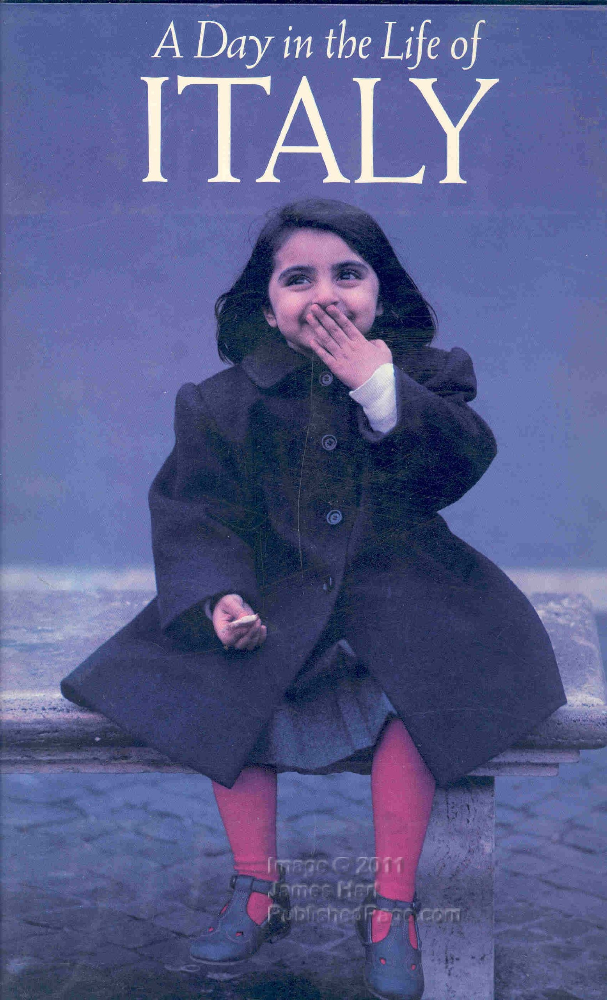

title: Dirt &amp; Deity: A Life of Robert Burns
description: A marginally educated seducer and drunk who died at 37 in 1796 remains Scotland's premier poet and songsmith. McIntyre's bicentenary biography (his last was a life of BBC founder John Reith, The Expense of Glory) is unsparing about Burns and his uneven output, from haunting lyrics to bawdy songs. Carlyle, so McIntyre writes, saw Burns's career as "a tragedy of potential unfulfilled and opportunity squandered." Rather, McIntyre contends, there was scant opportunity in hardscrabble Ayrshire in Burns's time, and the flavor of that bleak life as it was actually lived is vividly evoked, as are the poet's self-defeating imprudences of every sort. Having little schooling, Burns pragmatically described his working methods as "Untill I am compleat master of a tune, in my own singing... I can never compose for it." His practice was not that of the university, but it produced "Flow gently, sweet Afton" and "The Cotter's Saturday Night."

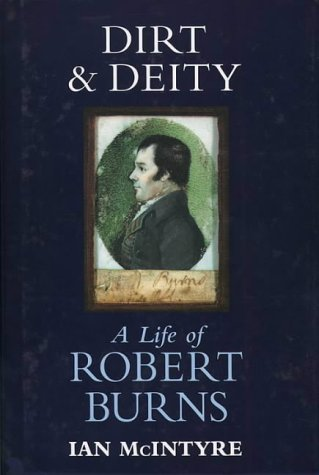

title: The Life of My Choice
description: Perhaps the last of the great romantic gentleman-explorers, Thesiger, author of Arabian Sands and The Marsh Arabs, here looks back on an extraordinary life. He was born in Abyssinia (Ethiopia) to British diplomatic parents who were friends of Emperor Haile Selassie. Thesiger remembers Addis Ababa, the capital, as a village with grass huts, no roads and colorful ceremonies. He attended Eton and Oxford, then returned to Africa for the first of many journeys, exploring the Awash River (home to the dreaded Danakil, whose warriors killed randomly to prove their manhood and collected their victims' genitals for trophies). As a district officer in the Sudan Political Service, Thesiger had further opportunities to travel in desert lands and meet nomadic tribes. During World War II, he served with Orde Wingate's troops, liberating Abyssinia from the Italians; later, he fought behind the lines in the Western Desert. In addition to superb adventure, Thesi

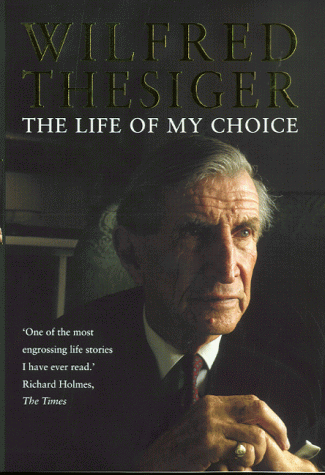

title: The Wall: Images and Offerings from the Vietnam Veterans Memorial
description: This volume, to be published on the fifth anniversary of the dedication of the national shrine, includes photographs by freelance photographer Lopes and 16 other photojournalists, and excerpts of letters placed at the wailing wall by families, friends and war buddies of the dead and missing whose names are engraved there"the mystery of death writ in stone 58,132 times." This American family album is deeply moving in its simplicity: "Damn you, brotherwhy didn't you come back? . . . I still love you, and I'd love you if you came back in one piece, or your arms or legs or mind gone." Among the 75 poignant color and black-and-white pictures photographed with respect, a child is lifted by a veteran to plant a kiss on a name; flowers, teddy bears, flags and uniforms grace the polished black granite. In his introduction, Vietnam veteran and freelance writer Norman discusses the controversy over the Wall's de

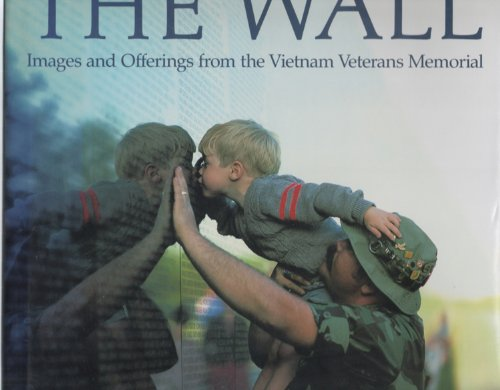

title: The days of the dead: Mexico's Festival of Communion with the Departed
description: Text: English, Spanish
image: http://ecx.images-amazon.com/images/I/81bsa2bIYSL.jpg


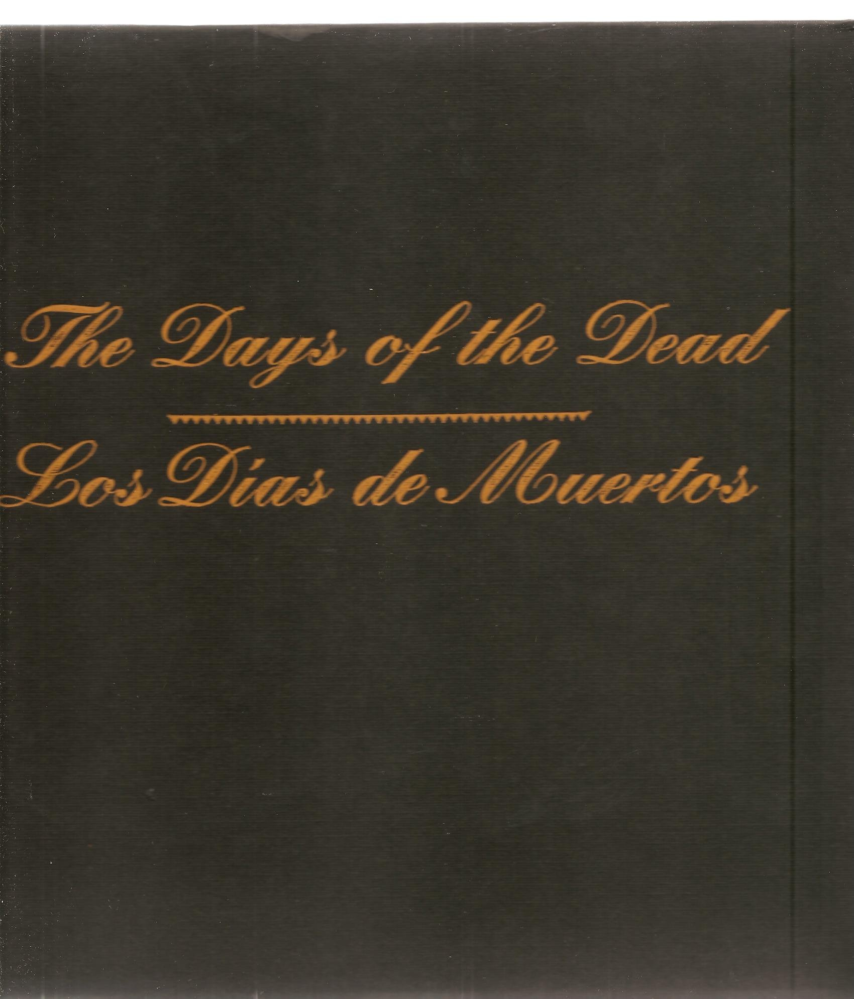

title: Insects of Britain &amp; Northern Europe: The Complete Insect Guide (Collins Field Guide)
description: Michael Chinery is the UK,s leading writer on insects. His 'Collins Field Guide to 'Insects, and 'Collins Pocket Guide to 'Insects, are acknowledged as the best available.
image: http://ecx.images-amazon.com/images/I/51BDHCJKBFL.jpg


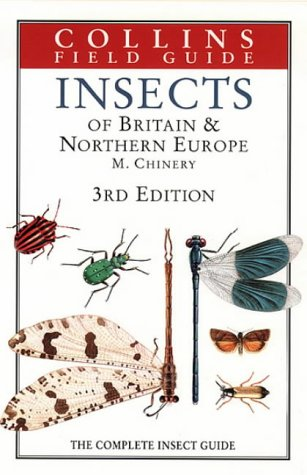

title: David Leadbetter 100% Golf: How to Unlock Your True Golfing Potential
description: David Leadbetter has coached players of the calibre of Nick Faldo, Greg Norman and Ernie Els. He is a regular contributor to Golf International and Golf Digest magazines, and his four best-selling books have sold over a million copies between them worldwide. There are sixteen David Leadbetter Golfing Academies around the world putting his teaching theories into practice.
image: http://ecx.images-amazon.com/images/I/51FS1DY2ATL.jpg


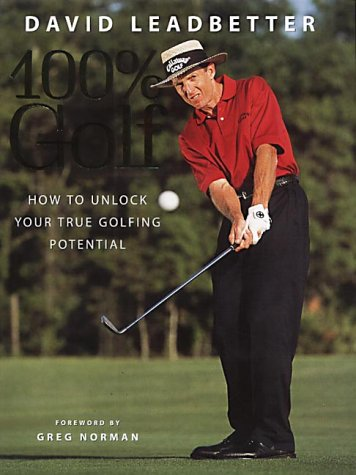

title: Animal Riddles (Beginner Series)
description: By Bennet Cerf, Illustrated by Roy McKie
image: http://ecx.images-amazon.com/images/I/71QRPW0JP8L.gif


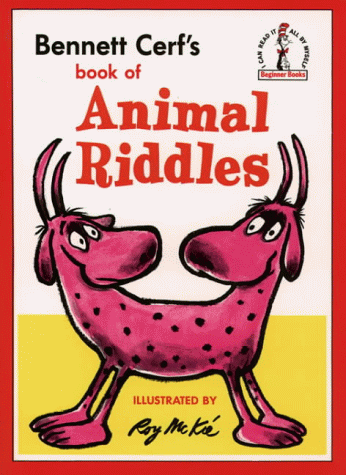

title: Come Over to My House (Beginner Series)
description: With his unique combination of hilarious stories, zany pictures and riotous rhymes, Dr. Seuss has been delighting young children and helping them learn to read for over fifty years. Creator of the wonderfully anarchic Cat in the Hat, and ranked among the UK's top ten favourite children's authors, Dr. Seuss is a global best-seller, with over half a billion books sold worldwide.--This text refers to thePaperbackedition.
image: http://ecx.images-amazon.com/images/I/51JyIAoa-kL.jpg


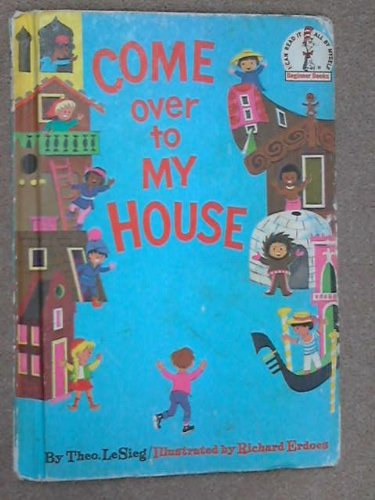

title: A History of the House of Lords
description: Longford  is Frank Pakenham, 7th Earl of Lonford.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51145YEJCTL.jpg


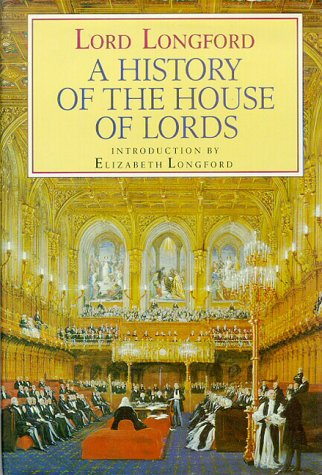

title: The Stationary Ark
description: 7 1-hour cassettes--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51upohNcYdL.jpg


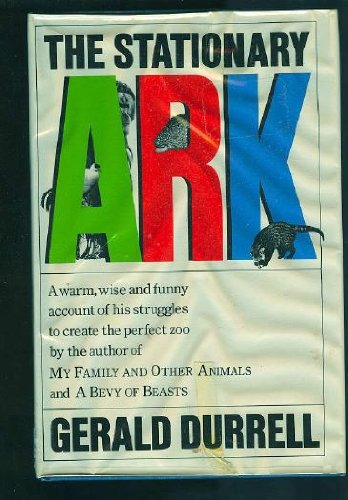

title: A Day in the Life of Canada
description: Like the similar books about Australia, Hawaii, and Japan, each of these offers multiple photographic impressions recorded on a single day. Canada, for coverage of so vast a territory, engaged 100 international photographers (to Israelis ' mostly native 55), to produce 100,000 images (to Israelis ' 40,000), from which its several hundred memorable black-and-white and color illustrations were chosen. The photos juxtapose the industrial to the rural. A lively essay recounts experiences organizing the project and photographing on the actual day (June 8, 1984). The photographers get credit next to their pictures; a map shows where each worked that day; and a lengthy section gives their respective backgrounds, illustrated with past work. Israelis seems earnest, even somber, in comparison. With more than 300 equally fine images, it plays down the individual artists, presenting only a list of credits at the end. The introduction discusses not so

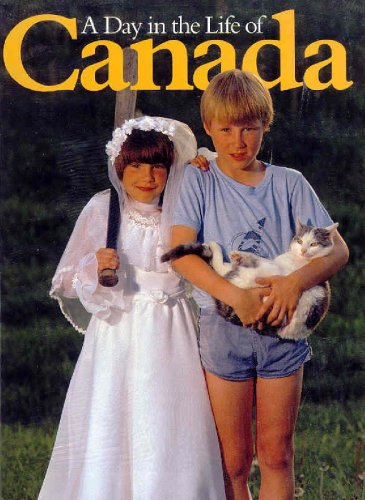

title: The Other Nuremberg: The Untold Story of the Tokyo War Crimes Trials
description: The Japanese Class A war crimes trials were plagued with problems from formation to end: they did not receive the same respect as those at Nuremberg; the prosecution found many important documents lost or destroyed; the defense struggled with inadequate staff and time; and some judgments and the legal basis of the trials were subject to harsh criticism. The late author, a correspondent at the trials, used his experience, memoirs, transcripts, and interviews to construct a personal and insightful account of this important event. Richard Minear's Victor's Justice (1971) is a more analytic treatment, but The Other Nuremberg will appeal to layperson and scholar alike. Recommended. Kenneth W. Berger, Duke Univ. Lib., Durham, N.C.Copyright 1987 Reed Business Information, Inc.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/41LNUCtQFd

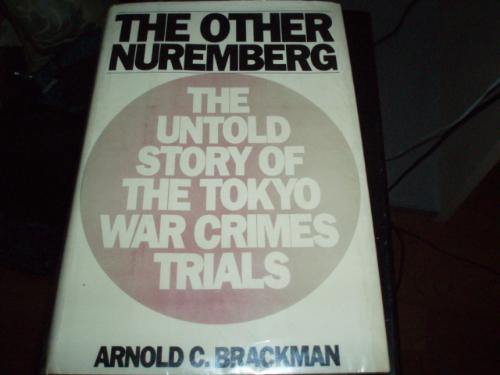

title: Secret Servant: My Life with the K. G. B.
description: Dzhirkvelov writes that although he never opposed the Soviet regime, he was disturbed by the increasing corruption of the privileged elite, the fierce power struggles at the top, the heavy drinking and immoral ways of the ideological leaders "and their utter contempt for the ordinary people." He was especially disturbed when his spy masters began treating him with contempt; he defected to the West in 1980. A 30-year veteran of the KGB, Dzhirkvelov's descriptions of organizational structures at various levels along with operational techniquesincluding activities he took part inrepresent a rare insider's look at the Soviet security system. On the other hand, this defector claims that the 1953 "doctor's plot" against Stalin was nothing more than "an amusing idea" of the Western media, that the KGB is not as powerful as is generally thought in the West, and that stories of religious persecution in the Soviet Union are greatly ex

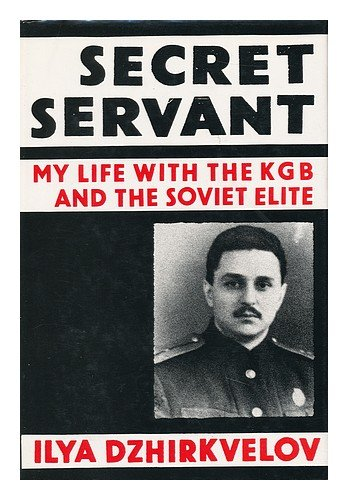

title: Birds of Britain and Europe with North Africa and the Middle East: Over 3,000 Colour Illustrations (Collins Pocket Guide)
description: Brilliantly organised guide ... beautiful, apparently infallible, so comprehensive and above all easy to use. The Sunday Times  Superbly handy and comprehensive guide. The Observer
image: http://ecx.images-amazon.com/images/I/41JPJSFVNEL.jpg


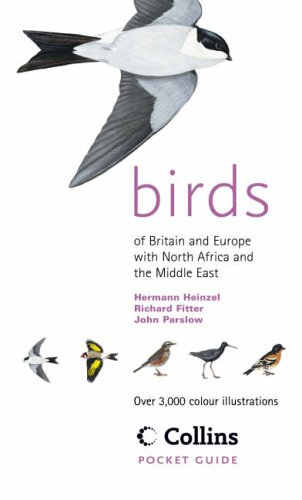

title: Botham: My Autobiography
description: 'The cricket book of the year' The Times 'Plenty of indiscretion, malice and comedy' Daily Telegraph--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/414MSNP654L.jpg


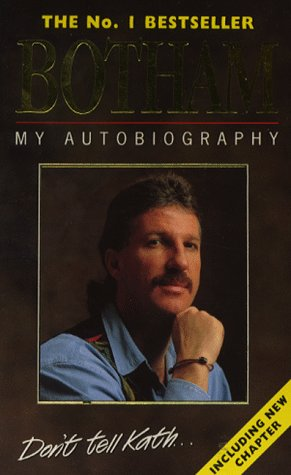

ignore ingestion exception
title: Mammals of Britain &amp; Europe (Collins Field Guide)
description: 'an excellent field guide...beautifully and lavishly illustrated' Times Literary Supplement '...an invaluable book for the amateur naturalist and professional alike' British Wildlife Magazine
image: http://ecx.images-amazon.com/images/I/41HQHKEA6XL.jpg


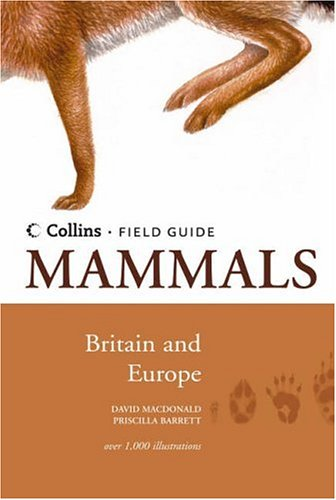

title: A Day in the Life of Japan
description: On June 7, 1985, 100 photographers from around the world set out to cover Japan. Many had participated in A Day in the Life of Canada ( LJ 11/1/85) and the similar books on Australia and Hawaii. This, however, is the first such coverage of a non-Western, non-English-speaking country. The color photographs are sumptuously reproduced and every one holds our attention. The pictures are arranged chronologically, from early morning until late at night. A map of Japan shows where each was taken. Photographers are credited next to their pictures, and biographies of participants follow the picture essay, as does a story about their experiences taking these 300 pictures, chosen from some 135,000 exposures. The range of subjects covered is enormous and shakes up our notions about Japan. Highly recommended. Kathleen Collins, Library of CongressCopyright 1986 Reed Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/71uT9mAgL9L.jpg


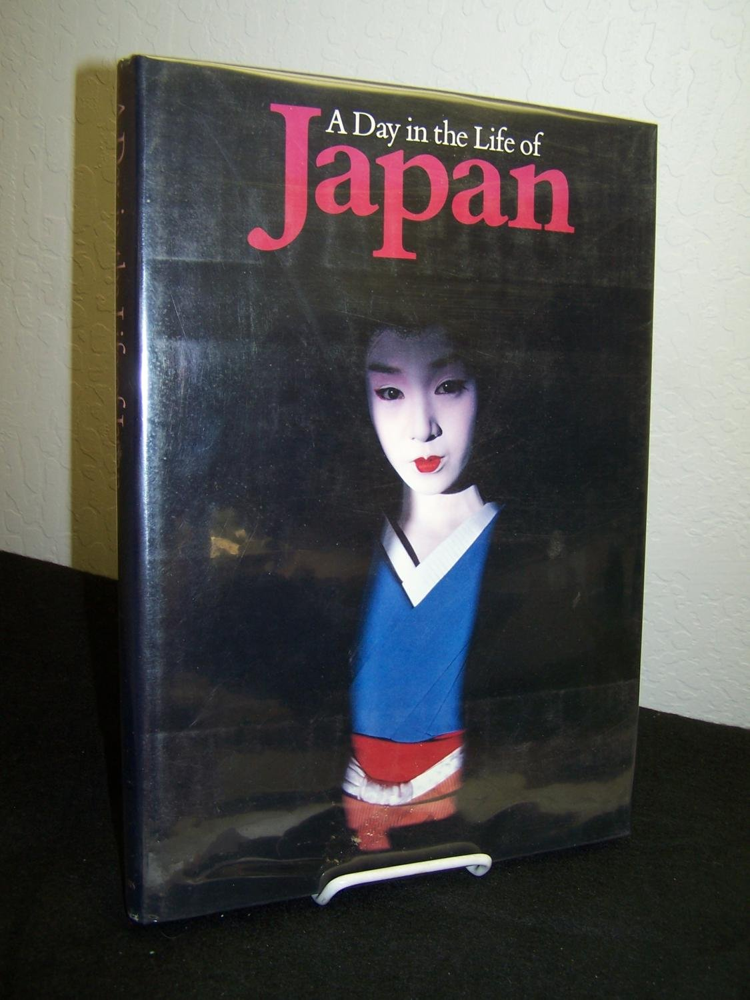

title: Harvey Penick's Little Red Golf Book: Lessons and Teachings from a Lifetime in Golf
description: Before titanium drivers, before oversized heads and bubble shafts, before electronic systems to tell you how far you are from the pin, golf was much the same game it is today. The lessons Harvey Penick taught in the pre-gadget days  still stand. The golf swing is basically the same, and Penick could teach it better than anybody. For most of his life, he never intended to publish hisLittle Red Book, a notebook of golf wisdom and anecdotes that he  compiled with the idea that he'd pass it on to his son. But, for the sake of history, it's a good thing that he changed his mind. Contained in its 175 pages is just about all you need to know about golf from a technical standpoint, along with Penick's priceless memories of working with famous pros, teaching absolute nobodies to get the ball in the air, and finding a horde of bat guano and hauling it across town in a pickup truck to fertilize

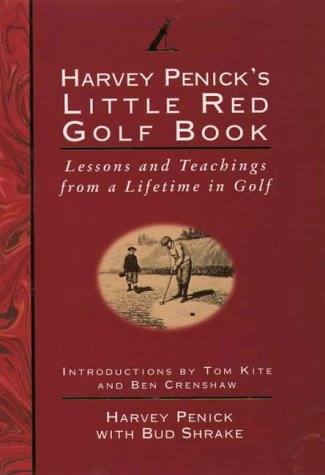

title: City of Djinns: A Year in Delhi
description: Delhi has a richly layered past, and Dalrymple (In Xanadu, McKay, 1990) deftly peels away each layer to reveal how the city came to be what it is today. Djinns are spirits said to be seen only after prolonged fasting and prayer; they too are integral to understanding the city. The author, a young Scot carrying on the fine British tradition of travel writing, has a knack for meeting fascinating people and capturing their most revealing remarks. He introduces us to dervishes, eunuchs, partridge fighting, weddings, and expatriates. His wife contributes sketches that nicely complement his text. Considering the importance of Delhi, the capital of the world's second most populous nation, this book deserves to be in most public and academic libraries.Harold M. Otness, Southern Oregon State Coll. Lib., AshlandCopyright 1994 Reed Business Information, Inc.
image: http://ecx.images-amazon.com/images/I/51xVoZwHYvL.jpg


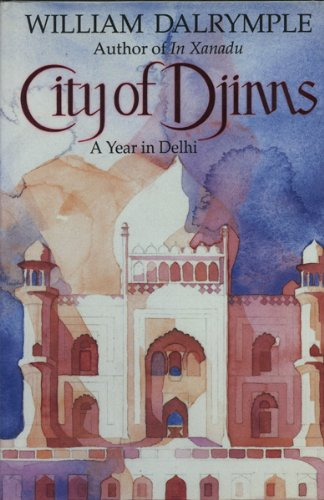

title: Foggy: The Explosive Autobiography
description: "brutal, unrelenting honesty leaps from every page" The Daily Telegraph
image: http://ecx.images-amazon.com/images/I/51x6cVDRVzL.jpg


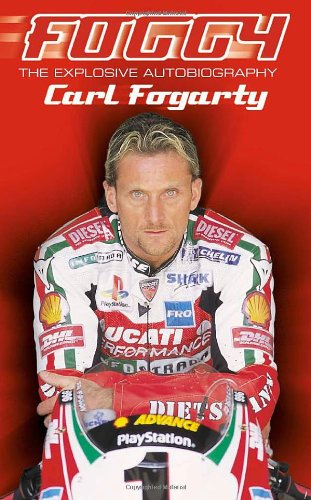

title: How to Identify Edible Mushrooms (Collins)
description: Patrick Harding&nbsp;is the author ofMushroom Hunting,Mushrooms,Mushrooms and Toadstools&nbsp;Photoguide,&nbsp;andNeed to Know Mushroom Hunting, and has had years of experience lecturing and leading groups on fungal forays.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/511AA9XG7XL.jpg


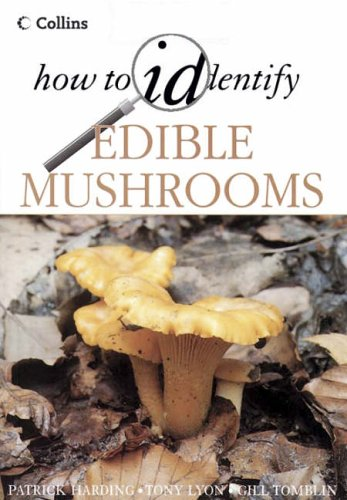

title: Demanding the Impossible: A History of Anarchism
description: The goal of an egalitarian, communal society has always united Marxists and leftist socialists, some of the latter (often if not always described as anarchists) refusing any truck with centralized power At various times, such ideas have found relatively wide appeal, and this era is one&mdash;expressed for instance in the antiglobalization movement's emphases on local control and direct democracy&mdash;making Marshall's comprehensive treatment a timely read. Newly revised and updated, this indispensable history of social libertarian thought now reaches into the 21st century&mdash;touching upon themes echoed in other recent titles, including Raj Patel'sThe Value of Nothing. Marshall casts a wide net, gathering all traces of antiauthoritarian socialist thought in works from Lao Tzu through Noam Chomsky, social ecology, and the Zapatistas. Readers will be repeatedly rewarded by Marshall's judiciousness and close readings 

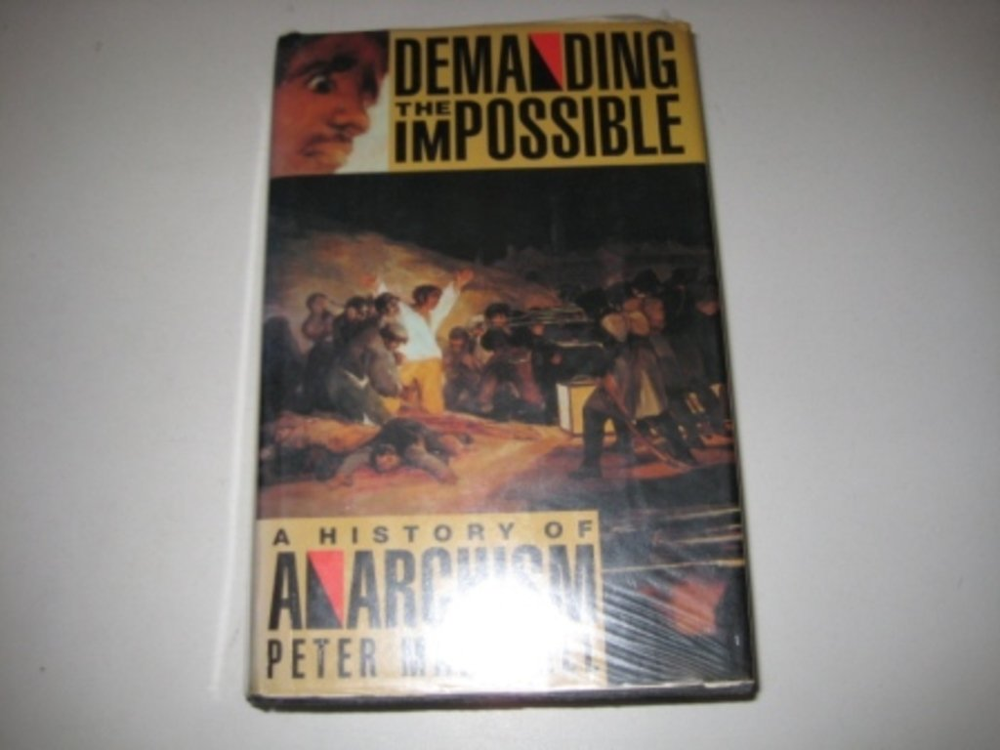

title: The Snow Tiger
description: Desmond Bagley was born in 1923, in Kendal, a rural town in England's scenic Lake District. He left school aged fourteen and worked for a number of years in the aircraft industry before embarking on an adventure - travelling to South Africa by road and supporting himself along the way by working in gold and asbestos mines. Bagley spent the Fifties in South Africa, working as a freelance journalist and critic, before moving to Italy with his wife, Margaret, and then to Guernsey. His first novel, The Golden Keel, was based on a true story overheard by Bagley in a bar in Johannesburg, about Mussolini's vast personal riches and the men who went looking for it. It was published in 1963 to great acclaim and followed by a further fifteen popular adventure ovels. Bgley's career spanned two decades and his influence can be seen in the work of several highly respected thriller writers. When he died, in 1983, his final novel, Juggernaut, was completed by his wif

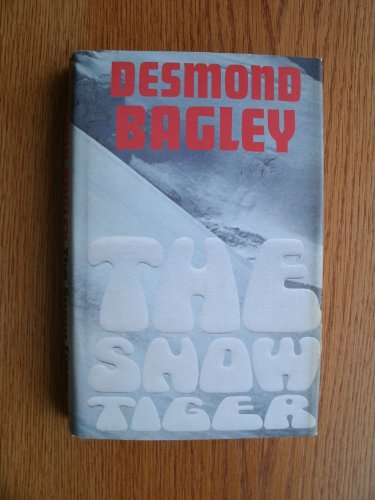

title: Wild Flowers of Britain &amp; Europe (Collins Nature Guides)
description: By W. Lippert and D. Podlech
image: http://ecx.images-amazon.com/images/I/514WRSHPWFL.jpg


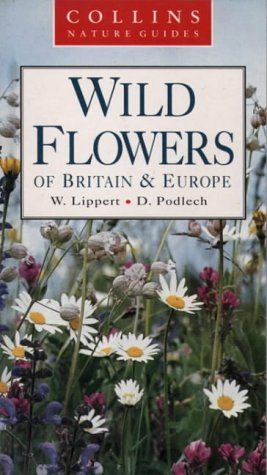

title: Grasses, Sedges, Rushes and Ferns of Britain and Northern Europe (Collins Pocket Guide)
description: Richard Fitter and Alastair Fitter, Illustrated by Ann Farrer
image: http://ecx.images-amazon.com/images/I/518YTCMNKYL.jpg


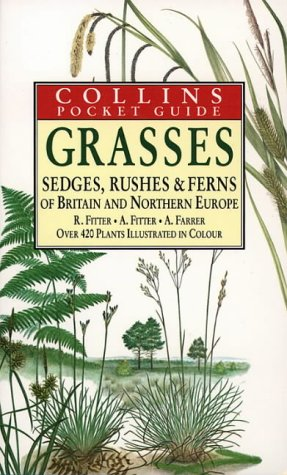

title: Masai Days
description: Bentsen's six-year-long relationship with a group of Maasai prompted this respectful account of villagers who regard cows as currency and resist new ways of life. According to PW , this is a "warmhearted portrayal of a proud, tenacious people--one of the most compassionate books ever written about Africans." Photos.Copyright 1991 Reed Business Information, Inc.--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/6171Oh82d-L.jpg


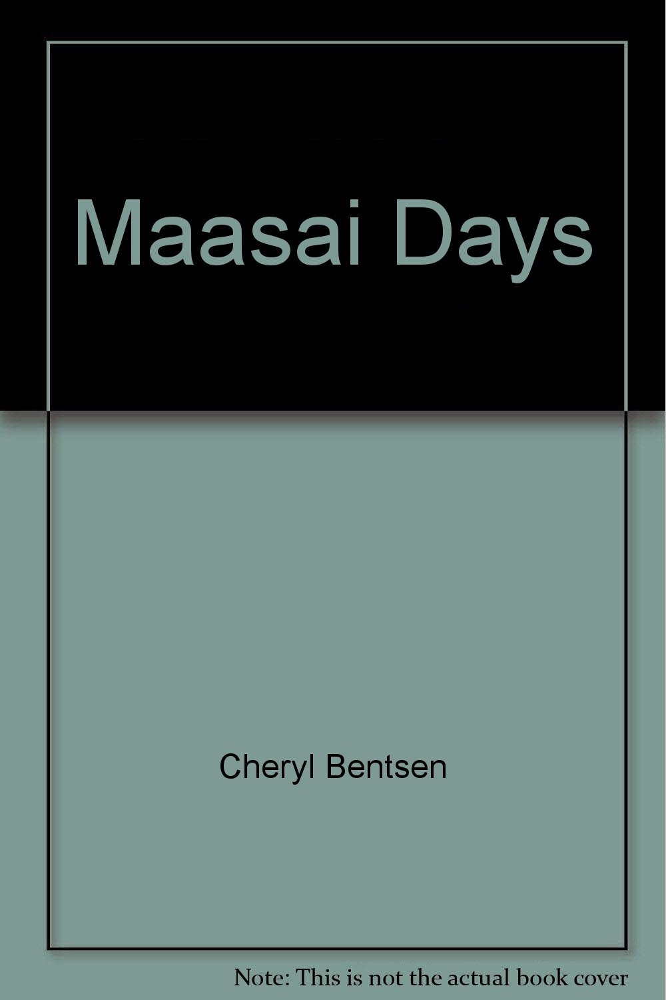

title: Faults and Fixes
description: 'An excellent practical guide to the game' Daily Telegraph
image: http://ecx.images-amazon.com/images/I/51X1HN4W90L.jpg


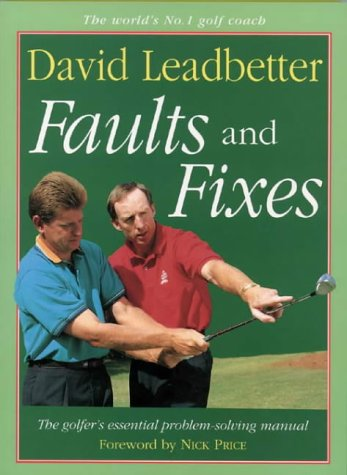

title: Italy, The Beautiful Cookbook: Authentic Recipes from the Regions of Italy
description: Lorenza de Medici has published more than 30 cookbooks. She has appeared in a 13-part series on Italian cooking for public television and conducts a cooking school at Badia a Coltibuono, an 11th-century estate and winery near the Chianti region of Tuscany. She divides her time between Milan and Badia a Coltibuono.
image: http://ecx.images-amazon.com/images/I/51QNHEJ290L.jpg


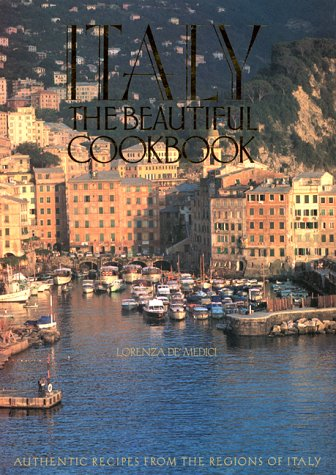

title: A Field Guide to the Reptiles and Amphibians of Britain and Europe (Collins Field Guide)
description: 'it is undoubtedly the best guide available on the market' The London Naturalist
image: http://ecx.images-amazon.com/images/I/51J0JZA6B1L.jpg


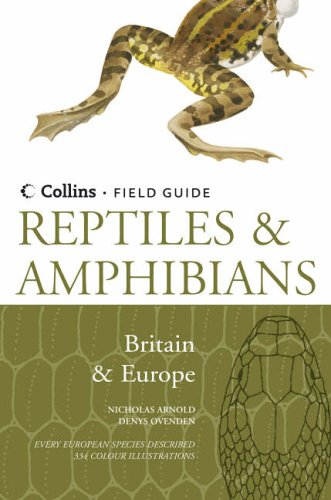

title: Renoir, My Father
description: Text: English (translation)Original Language: French--This text refers to thePaperbackedition.
image: http://ecx.images-amazon.com/images/I/41isN3EczFL.jpg


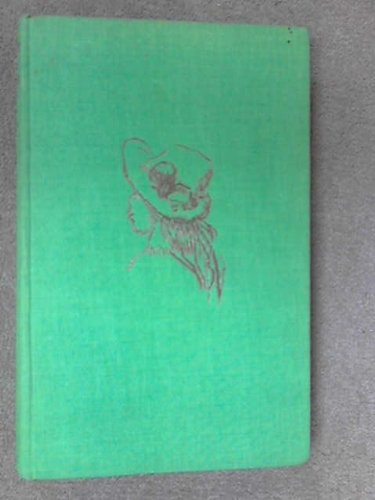

title: Erl King
description: No summary can suggest the rich texture, the dazzling profundity and creative vitality of this novel; the strangest and most haunting to come out of the fratricidal war --Sunday Times  Must be one of the best novels published anywhere since the war --New Statesman  item  The Erl-King is the work of a brilliant and mature writer --Guardian
image: http://ecx.images-amazon.com/images/I/51rsdmQjtdL.jpg


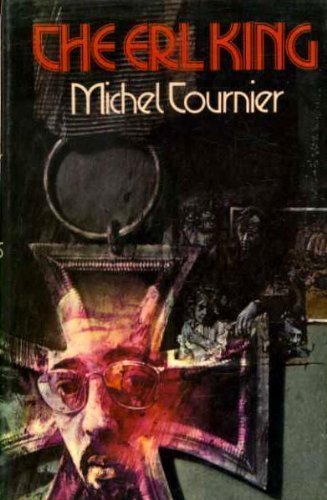

title: Tramp in Armour
description: How does a 50-ton Matilda tank named Bert stay hidden? By becoming unhappily entrapped in a railroad tunnel during an air raid, and then by moving carefully across hundreds of miles of French countryside behind German lines all the way to Calais. There, this lonesome British tank finally emerges to blow up a Nazi ammunition dump and its full complement of Panzers. Barrett adeptly represents the English, Canadian and Anglicized French and German accents of the all-male military cast of characters. His skillful reading heightens the tension of this World War II thriller and keeps the listener anxious to hear what happens next, rooting for Bert throughout the tale.  J.D.N.   (c)AudioFile, Portland, Maine--This text refers to theAudio Cassetteedition.
image: http://ecx.images-amazon.com/images/I/51XEv5zjmzL.jpg


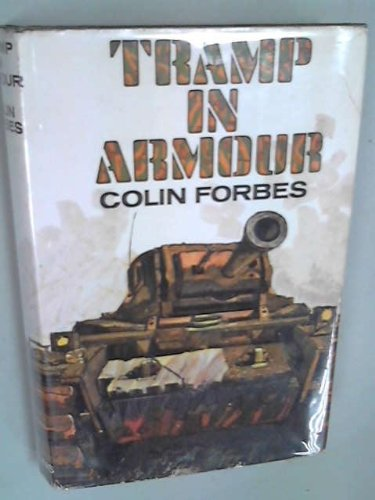

title: The Black Moon
description: "From the incomparable Winston Graham...who has everything anyone else has, then a whole lot more."--This text refers to an out of print or unavailable edition of this title.
image: http://ecx.images-amazon.com/images/I/51M3SkV-AZL.jpg


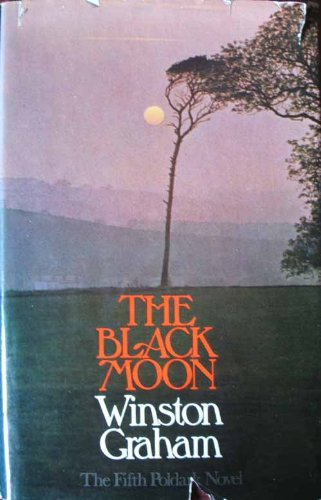

In [28]:
from urllib.request import urlopen
from IPython.display import display, Image

count=0
with open('meta_Books.json', "r") as json_file:
    for line in json_file:
        #print(line)
        data = ast.literal_eval(line)
        if not 'title' in data or not data['title'] or not 'description' in data or not data['description'] or not 'imUrl' in data or not data['imUrl']:
            continue
        
        try:
            with urlopen(data['imUrl']) as url:
                imgage_byte = url.read()
                input_image_binary = base64.b64encode(imgage_byte).decode("utf8")
        except:
            print("download image failed")
            continue
        try:
            product_index_body = {"image_description": data['description'],"image_binary":input_image_binary}
            aos_client.index(index='multimodal_product',body=product_index_body)
            count = count+1
        except:
            print("ignore ingestion exception")
            continue
        if count >=100:
            break
        print("title: " + data['title'])
        print("description: " + data['description'])
        print("image: " + data['imUrl'])
        display(Image(data['imUrl']))


In [29]:
res = aos_client.search(index="multimodal_product", body={"query": {"match_all": {}}})
print("Records found: %d." % res['hits']['total']['value'])

Records found: 100.


### 14. Multimodal Search with text


In [30]:
import pandas as pd
from IPython.display import display, Image

def multimodal_text_search(query_text,model_id):
    query={
        "_source": {
            "exclude": [ "vector_embedding" ]
        },
        "size": 3,
        "query": {
            "neural": {
                "vector_embedding": {
                "query_text": query_text,
                "model_id": model_id,
                "k": 3
                }
            }
          }
    }
    res = aos_client.search(index="multimodal_product", 
                           body=query,
                           stored_fields=["image_description","image_binary"])
    #print("Got %d Hits:" % res['hits']['total']['value'])
    query_result=[]
    for hit in res['hits']['hits']:
        #print(hit)
        row=[hit['_id'],hit['_score'],hit['_source']['image_description'],hit['_source']['image_binary']]
        #row=[hit['_id'],hit['_score'],hit['_source']['image_description']]
        query_result.append(row)

    query_result_df = pd.DataFrame(data=query_result,columns=["_id","_score","image_description","image_binary"])
    #display(query_result_df)
    
    for index, row in query_result_df.iterrows():
        score_str = "{:.5f}".format(row['_score'])
        print("score:" + score_str +  ", description: " + row['image_description'])
        display(Image(base64.b64decode(row['image_binary'])))

### Search "Measure for Measure" with multimodal

score:0.61595, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


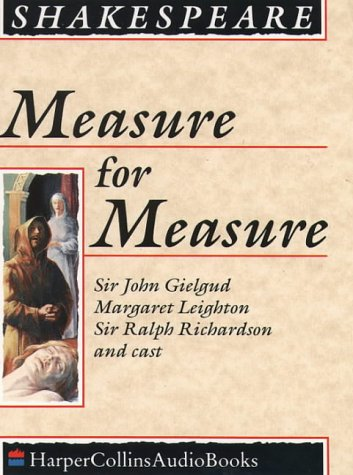

score:0.55125, description: Text: English (translation)Original Language: German


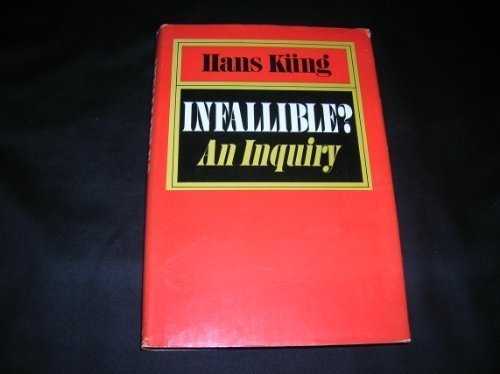

score:0.54312, description: Text: English, Italian (translation)


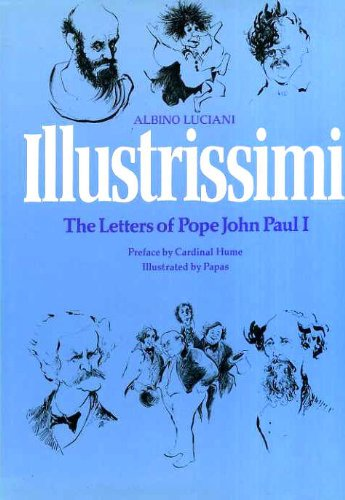

In [31]:
multimodal_text_search("Measure for Measure",model_id)

### Search "Rightly Dividing the Word" with multimodal

score:0.59810, description: --This text refers to thePaperbackedition.


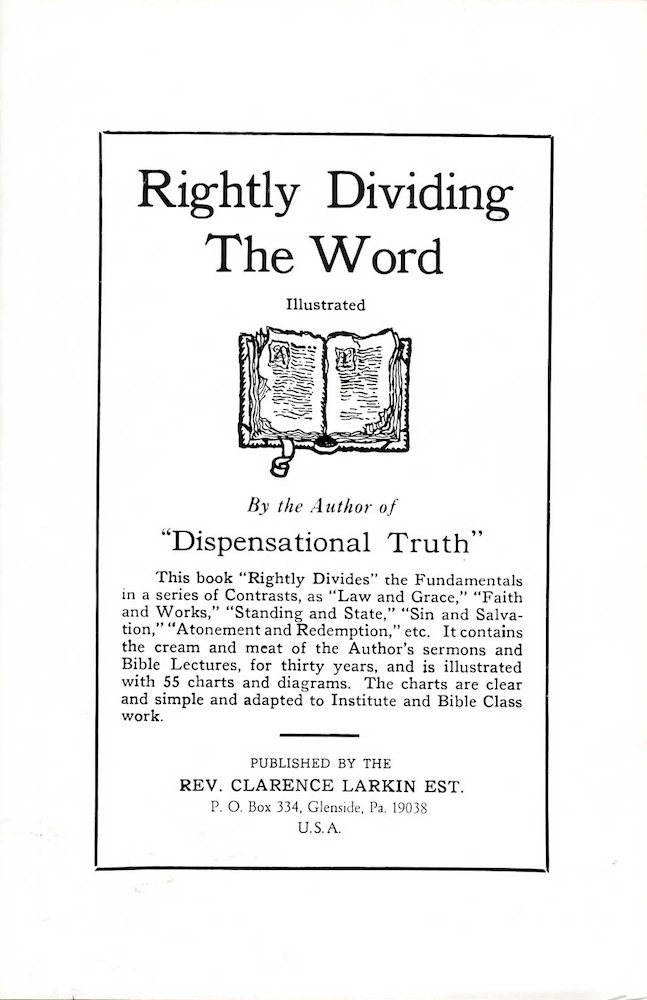

score:0.52789, description: Text: English (translation)Original Language: German


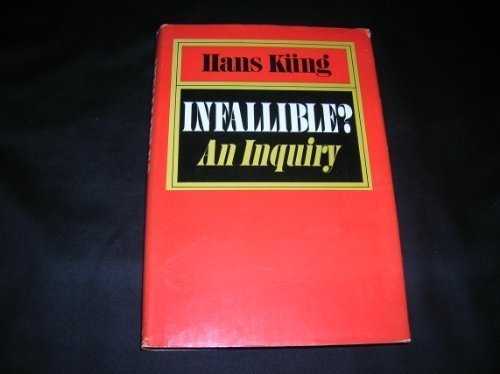

score:0.52073, description: Text: English, French (translation)


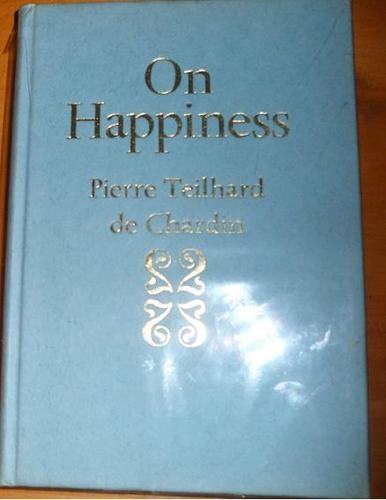

In [32]:
multimodal_text_search("Rightly Dividing the Word",model_id)

### 15. Multimodal Search with image

In [33]:
def multimodal_image_search(query_image,model_id):
    query={
        "_source": {
            "exclude": [ "vector_embedding" ]
        },
        "size": 3,
        "query": {
            "neural": {
                "vector_embedding": {
                "query_image": query_image,
                "model_id": model_id,
                "k": 3
                }
            }
          }
    }
    res = aos_client.search(index="multimodal_product", 
                           body=query,
                           stored_fields=["image_description","image_binary"])
    #print("Got %d Hits:" % res['hits']['total']['value'])
    query_result=[]
    for hit in res['hits']['hits']:
        #print(hit)
        row=[hit['_id'],hit['_score'],hit['_source']['image_description'],hit['_source']['image_binary']]
        #row=[hit['_id'],hit['_score'],hit['_source']['image_description']]
        query_result.append(row)

    query_result_df = pd.DataFrame(data=query_result,columns=["_id","_score","image_description","image_binary"])
    #display(query_result_df)
    
    for index, row in query_result_df.iterrows():
        score_str = "{:.5f}".format(row['_score'])
        print("score:" + score_str +  ", description: " + row['image_description'])
        display(Image(base64.b64decode(row['image_binary'])))

### Search book image with multimodal

score:0.74572, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


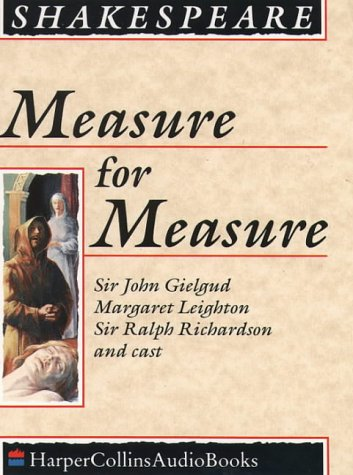

score:0.56412, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


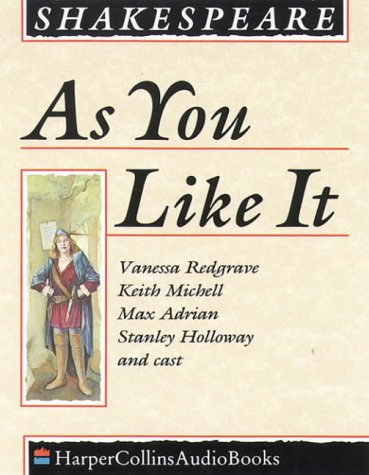

score:0.54560, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


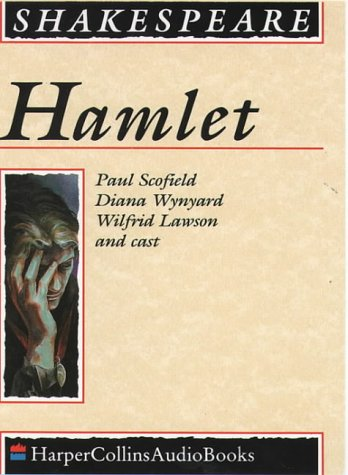

In [34]:
measure_for_measure_book_image_url = "http://ecx.images-amazon.com/images/I/5166EBHDQYL.jpg"

local_image = measure_for_measure_book_image_url.split("/")[-1]
urllib.request.urlretrieve(measure_for_measure_book_image_url, local_image)

with open(local_image, "rb") as image_file:
    input_image_binary = base64.b64encode(image_file.read()).decode("utf8")

multimodal_image_search(input_image_binary,model_id)

### 16. Multimodal Search with text and image

In [35]:
def multimodal_text_and_image_search(query_text, query_image,model_id):
    query={
        "_source": {
            "exclude": [ "vector_embedding" ]
        },
        "size": 3,
        "query": {
            "neural": {
                "vector_embedding": {
                    "query_text": query_text,
                    "query_image": query_image,
                    "model_id": model_id,
                    "k": 3
                }
            }
          }
    }
    res = aos_client.search(index="multimodal_product", 
                           body=query,
                           stored_fields=["image_description","image_binary"])
    #print("Got %d Hits:" % res['hits']['total']['value'])
    query_result=[]
    for hit in res['hits']['hits']:
        #print(hit)
        row=[hit['_id'],hit['_score'],hit['_source']['image_description'],hit['_source']['image_binary']]
        #row=[hit['_id'],hit['_score'],hit['_source']['image_description']]
        query_result.append(row)

    query_result_df = pd.DataFrame(data=query_result,columns=["_id","_score","image_description","image_binary"])
    #display(query_result_df)
    
    for index, row in query_result_df.iterrows():
        score_str = "{:.5f}".format(row['_score'])
        print("score:" + score_str +  ", description: " + row['image_description'])
        display(Image(base64.b64decode(row['image_binary'])))

### Search text(book description) and image with multimodal

score:0.79704, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


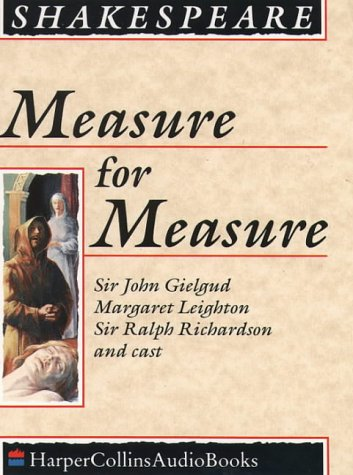

score:0.63263, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


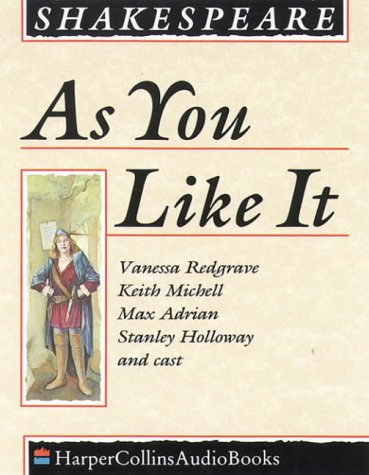

score:0.61215, description: William Shakespeare is widely regarded as the greatest playwright the world has seen. He produced an astonishing amount of work; 37 plays, 154 sonnets, and 5 poems. He died on 23rd April 1616, aged 52, and was buried in the Holy Trinity Church, Stratford.


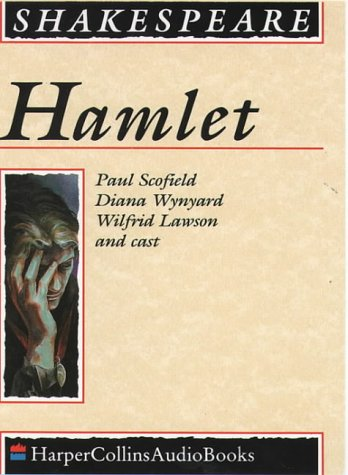

In [36]:
input_text="Measure for Measure"

measure_for_measure_book_image_url = "http://ecx.images-amazon.com/images/I/5166EBHDQYL.jpg"

local_image = measure_for_measure_book_image_url.split("/")[-1]
urllib.request.urlretrieve(measure_for_measure_book_image_url, local_image)

with open(local_image, "rb") as image_file:
    input_image_binary = base64.b64encode(image_file.read()).decode("utf8")

multimodal_text_and_image_search(input_text, input_image_binary,model_id)

### 17. Keyword Search

In [37]:
def keyword_search(query_text):
    query={
        "_source": {
            "exclude": [ "vector_embedding" ]
        },
        "size": 3,
        "query": {
            "match": {
                "image_description":query_text
            }
        }
    }

    res = aos_client.search(index="multimodal_product", 
                           body=query,
                           stored_fields=["image_description","image_binary"])
    #print("Got %d Hits:" % res['hits']['total']['value'])
    query_result=[]
    for hit in res['hits']['hits']:
        #print(hit)
        row=[hit['_id'],hit['_score'],hit['_source']['image_description'],hit['_source']['image_binary']]
        query_result.append(row)

    query_result_df = pd.DataFrame(data=query_result,columns=["_id","_score","image_description","image_binary"])
    #display(query_result_df)
    
    for index, row in query_result_df.iterrows():
        bin_data=row['image_binary']
        #display.Image(base64.b64decode(bin_data))
        print(row['image_description'])
        display(Image(base64.b64decode(bin_data)))

### Search "Measure for Measure" with keyword

'Archer has a gift for plot that can only be described as genius' Daily Telegraph


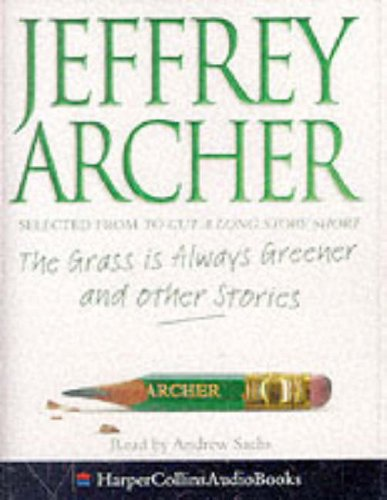

For lovers of extravagant words and action charged with mystery and passion, Mr Jarvis must be hard to beat.' Times Educational Supplement 'Jarvis creates a rich, intricate world... well worth reading.' The Daily Telegraph 'The best one yet!' 12-yr old fan, Tunbridge Wells


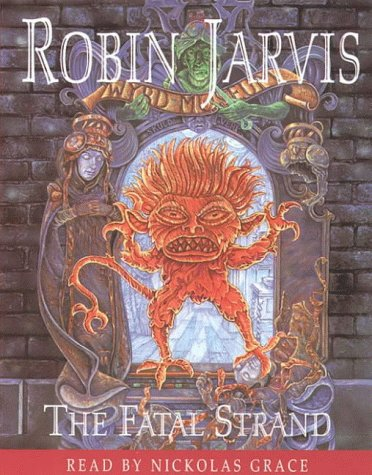

About The Raven's Knot: This book is mind-blowing, shocking and pretty darn good! Firstly I would just like to say that I love Robin Jarvis anyway, he is great... it was full of suspense and surprises. Jarvo rocks, may he write books for ever! Reader from Chester, Amazon.co.uk


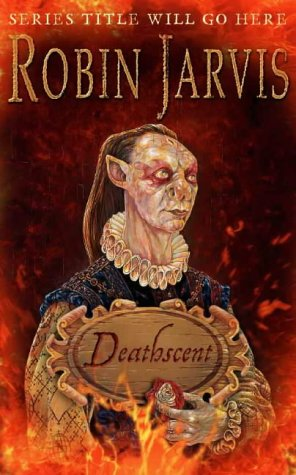

In [38]:
keyword_search("Measure for Measure")

### Search "Rightly Dividing the Word" with keyword

Can rightly be called a classic... the definitive historical and cultural account of the city... it inspires complete faith  SUNDAY TELEGRAPH (4/00)  The best guide to Rome  SEAN SWALLOW, TRAVEL BOOKSHOP  (7/98) The best guide to Rome published for many a long year  SUNDAY TIMES  Masson writes elegantly and with warmth, and knows her subject inside out  SUNDAY TELEGRAPH--This text refers to an out of print or unavailable edition of this title.


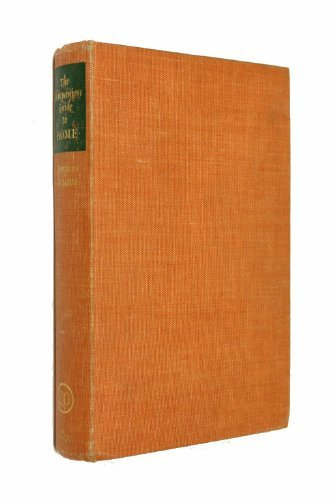

PreS?A humorous look at manners that's sure to appeal to preschoolers. The book opens as the Little Princess screams, "I want my dinner!" The picture of her red-faced temper tantrum, complete with silverware flying through the air, shows more than the text reveals. Next, she demands her potty (while squeezing toothpaste all over the cat). Finally, she remembers to say the magic word when she requests her teddy bear. Then, on a walk, she encounters a big, red-nosed blue Beastie. He pitches a fit about wanting his dinner, and the Little Princess tells him to say please. The smiling, yellow-crowned child reminds him to say thank you, too. The simple text combined with exuberant, colorful watercolors show Ross at his best. Any child who has been reminded to be courteous will appreciate the cheerful, comical illustrations.?Janet M. Bair, Trumbull Library, CTCopyright 1996 Reed Business Information, Inc.--This text refers to an out of print or unavailable edition of this title.


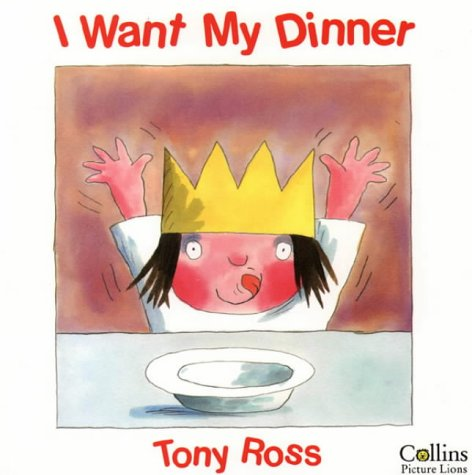

'it is undoubtedly the best guide available on the market' The London Naturalist


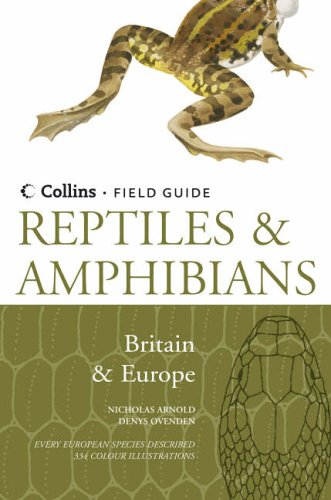

In [39]:
keyword_search("Rightly Dividing the Word")

### 18. Observe The Results

Compare the first few records in the two searches above. For the Semantic search, the first 10 or so results are very similar to our input questions, as we expect. Compare this to keyword search, where the results quickly start to deviate from our search query (e.g. "it shows xbox 360. Does it work for ps3 as well?" - this matches on keywords but has a different meaning).

You can also use "Compare search results" in Search relevance plugin to compare search relevance side by side. Please refer the lab "Option 2: OpenSearch Dashboard Dev Tools" to compare search results.

### 19. Choose another embedding model 

Go back to [Select Embedding Model](#Select-Embedding-Model)

### 20. Summary
With OpenSearch Neural Search remote model, embedding is automatically generated with model hosted in SageMaker or Bedrock. We don't need care about inference pipeline anymore. It makes the semantic search solution simple to develop and maintain. 